# Курсовой проект для курса "Библиотеки Python для Data Science: продолжение"
# *Прогноз дефолта по кредиту*


## Требования к курсовому проекту

**Задача**

На основании имеющихся данных о клиентах банка требуется построить модель для прогнозирования невыполнения долговых обязательств по текущему кредиту. Выполнить прогноз для примеров из тестового датасета.

**Наименование файлов с данными**

course_project_train.csv - обучающий датасет<br>
course_project_test.csv - тестовый датасет

**Целевая переменная**

Credit Default - факт невыполнения кредитных обязательств

**Метрика качества**

F1-score (sklearn.metrics.f1_score)

**Требования к решению**

*Целевая метрика*
* F1($\beta$ = 1) > 0.5 при Precision > 0.5 и Recall > 0.5
* Метрика оценивается по качеству прогноза для главного класса (1 - просрочка по кредиту)

*Решение должно содержать*
1. Тетрадка Jupyter Notebook с кодом Вашего решения, названная по образцу {ФИО}\_solution.ipynb, пример SShirkin\_solution.ipynb
2. Файл CSV с прогнозами целевой переменной (0 или 1, а НЕ вероятность) для тестового датасета, названный по образцу {ФИО}\_predictions.csv, пример SShirkin\_predictions.csv

*Рекомендации для файла с кодом (ipynb)*
1. Файл должен содержать заголовки и комментарии (markdown)
2. Повторяющиеся операции лучше оформлять в виде функций
3. Не делать вывод большого количества строк таблиц (5-10 достаточно)
4. По возможности добавлять графики, описывающие данные (около 3-5)
5. Добавлять только лучшую модель, то есть не включать в код все варианты решения проекта
6. Скрипт проекта должен отрабатывать от начала и до конца (от загрузки данных до выгрузки предсказаний)
7. Весь проект должен быть в одном скрипте (файл ipynb).
8. Допускается применение библиотек Python и моделей машинного обучения,
которые были в данном курсе.

**Сроки сдачи**

Cдать проект нужно в течение 6 дней после окончания последнего вебинара (до 20:00 вс).
Оценки работ, сданных до дедлайна, будут представлены в виде рейтинга, ранжированного по заданной метрике качества.
Проекты, сданные после дедлайна или сданные повторно, не попадают в рейтинг, но можно будет узнать результат.

## Подключение библиотек и скриптов


In [2431]:
#!pip install catboost

In [2432]:
import numpy as np
import pandas as pd
import random

from scipy.stats import shapiro
from scipy.stats import probplot
from scipy.stats import ttest_ind, mannwhitneyu
from scipy.stats import chi2_contingency

from sklearn.model_selection import train_test_split, cross_val_score, ShuffleSplit, learning_curve
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, KFold, RandomizedSearchCV
from sklearn.metrics import f1_score, recall_score, precision_score, classification_report

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
#import xgboost as xgb
#import lightgbm as lgbm
import catboost as catb
from catboost import Pool

from sklearn.preprocessing import RobustScaler

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

plt.style.use('seaborn-ticks')
plt.rcParams['figure.figsize'] = (8, 6) # размер картинки графиков
plt.rcParams.update({'font.size': 14})  # размер шрифта на графиках
%config InlineBackend.figure_format = 'svg'

import warnings
warnings.filterwarnings('ignore')


## Определение функций и классов

In [2433]:
# функция формирует словарь из строковых категориальные переменных и индекса для последующего 
# преобразования строковых категориальных переменных в числовые категориальные
def cat2num(ds):
  my_dict = {}
  for i, name in enumerate(ds.unique()):
    my_dict[name] = i
  return my_dict

# функция печатает необходимые метрики для тренировочного и тестовых наборов, которые подаются на вход
def get_classification_report(y_train_true, y_train_pred, y_test_true, y_test_pred):
    print('TRAIN\n\n' + classification_report(y_train_true, y_train_pred))
    print('TEST\n\n' + classification_report(y_test_true, y_test_pred))
    print('CONFUSION MATRIX\n')
    print(pd.crosstab(y_test_true, y_test_pred))

# функция рисует графики и таблицу зависимости метрик от порога вероятности
def show_proba_calibration_plots(y_predicted_probs, y_true_labels):
    preds_with_true_labels = np.array(list(zip(y_predicted_probs, y_true_labels)))

    thresholds = []
    precisions = []
    recalls = []
    f1_scores = []

    for threshold in np.linspace(0.2, 0.6, 9):
        thresholds.append(threshold)
        precisions.append(precision_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))
        recalls.append(recall_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))
        f1_scores.append(f1_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))

    scores_table = pd.DataFrame({'f1':f1_scores,
                                 'precision':precisions,
                                 'recall':recalls,
                                 'probability':thresholds}).sort_values('f1', ascending=False).round(3)
      
    figure = plt.figure(figsize = (15, 5))

    plt1 = figure.add_subplot(121)
    plt1.axhline(0.5, color="red")
    plt1.plot(thresholds, precisions, label='Precision', linewidth=4)
    plt1.plot(thresholds, recalls, label='Recall', linewidth=4)
    plt1.plot(thresholds, f1_scores, label='F1', linewidth=4)
    plt1.set_ylabel('Scores')
    plt1.set_xlabel('Probability threshold')
    plt1.set_title('Probabilities threshold calibration')
    plt1.legend(bbox_to_anchor=(0.25, 0.25))   
    plt1.table(cellText = scores_table.values,
               colLabels = scores_table.columns, 
               colLoc = 'center', cellLoc = 'center', loc = 'bottom', bbox = [0, -1.3, 1, 1])

    plt2 = figure.add_subplot(122)
    plt2.hist(preds_with_true_labels[preds_with_true_labels[:, 1] == 0][:, 0], 
              label='Another class', color='royalblue', alpha=0.5)
    plt2.hist(preds_with_true_labels[preds_with_true_labels[:, 1] == 1][:, 0], 
              label='Main class', color='darkcyan', alpha=0.8)
    plt2.set_ylabel('Number of examples')
    plt2.set_xlabel('Probabilities')
    plt2.set_title('Probability histogram')
    plt2.legend(bbox_to_anchor=(1, 1))

    plt.show()

# функция рисует график зависимости размера выборки тренировочного набора данных для обучения
def show_learning_curve_plot(estimator, X, y, cv=3, n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 5)):

    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, 
                                                            cv=cv, 
                                                            scoring='f1',
                                                            train_sizes=train_sizes, 
                                                            n_jobs=n_jobs)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    plt.figure(figsize=(15,8))
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.title(f"Learning curves ({type(estimator).__name__})")
    plt.xlabel("Training examples")
    plt.ylabel("Score")     
    plt.legend(loc="best")
    plt.grid()
    plt.show()

# функция рисует график степени важности признаков в работе соответствующец модели 
def show_feature_importances(feature_names, feature_importances, get_top=None):
    feature_importances = pd.DataFrame({'feature': feature_names, 'importance': feature_importances})
    feature_importances = feature_importances.sort_values('importance', ascending=False)
       
    plt.figure(figsize = (14, len(feature_importances) * 0.355))
    
    sns.barplot(feature_importances['importance'], feature_importances['feature'])
    
    plt.xlabel('Importance')
    plt.title('Importance of features')
    plt.show()

    if get_top is not None:
        return feature_importances['feature'][:get_top].tolist()

In [2434]:
# класс для предварительной обработки данных: преобразование типов, обработка выбросов,
# пустых значений, а также определение категориальных переменных
class DataPreprocessing:
    """Обработка исходных данных"""

    def __init__(self):
        """Параметры класса"""
        self.medians = None
        self.object_features_dict_2_enc = {} # словарь для преобразования номинативных признаков в числовые
        # Определим список признаков для преобразования из float в int для дальнейшей работы в методах класса
        self.float2int_list = []
        self.msld_min = [] # Минимальное значение признака 'Months since last delinquent'
        self.bankruptcies_max = [] # максимальное значение признака 'Bankruptcies'

    def fit(self, X):  
        """Сохранение статистик и необходимых переменных"""
        # Расчет медиан и прочих статистических переменных
        self.medians = X.median()
        self.mins = X.min()
        self.maxs = X.max()
        self.msld_min = self.mins['Months since last delinquent']
        self.bankruptcies_max = self.maxs['Bankruptcies']
        
        # сохраним статистики для Maximum Open Credit
        quart_range = X['Maximum Open Credit'].quantile(.75) - X['Maximum Open Credit'].quantile(.25)
        whis, dev = 1.5, 0.0
        self.min_quart = X['Maximum Open Credit'].quantile(.25) - (quart_range * (whis - dev))
        self.max_quart = X['Maximum Open Credit'].quantile(.75) + (quart_range * (whis + dev))
        
        # сохраним статистики для  Current Loan Amount
        quart_range_CLA = X['Current Loan Amount'].quantile(.75) - X['Current Loan Amount'].quantile(.25)
        whis, dev = 1.5, 0.0
        self.min_quart_CLA = X['Current Loan Amount'].quantile(.25) - (quart_range_CLA * (whis - dev))
        self.max_quart_CLA = X['Current Loan Amount'].quantile(.75) + (quart_range_CLA * (whis + dev))
        self.max_cla = X.loc[X['Current Loan Amount'] < self.max_quart_CLA, 'Current Loan Amount'].max() + 100000

        # Dictionaries to category features encoding
        for col in X.select_dtypes(include='object').columns.tolist():
          self.object_features_dict_2_enc[col] = cat2num(X[col])

        # Определим список признаков для преобразования из float в int для дальнейшей работы в методах класса
        self.float2int_list = ['Tax Liens','Number of Open Accounts','Number of Credit Problems',\
                               'Months since last delinquent', 'Bankruptcies', 'Credit Score']
        
        self.nan_feature_list = ['Annual Income', 'Credit Score', 'Months since last delinquent'] 
                                  
        
        # создадим экземпляр класса RobustScaler для масштабирования 
        self.scaler = RobustScaler()


    def transform(self, X):
        """Трансформация данных"""

        # Category features encoding
        for col in X.select_dtypes(include='object').columns.tolist():
          X[col] = X[col].replace(self.object_features_dict_2_enc.get(col))
        
        # Process empty values
          
          ## 'Bankruptcies' - присвоим пустым значениям новую категорию "неизвестно" равную максимальному знаянию + 1
        X.loc[X['Bankruptcies'].isna(), 'Bankruptcies'] = self.bankruptcies_max + 1
        
          ## 'Years in current job'
           ### заполним пустые значения значениями рассчитанными по методу KNN 
        knn_model = KNeighborsClassifier(n_neighbors=7)            
            ### определим наборы данных для работы с моделями
        temp_X = X.drop(self.nan_feature_list + ['Years in current job'], axis = 'columns')[~(X['Years in current job'] == 0)]
            ### целевая переменная для обучения
        temp_y = X.loc[~(X['Years in current job'] == 0), 'Years in current job']
            ### набор данных с пустыми значениями целевой переменной, для предсказания значений для заполнения
        temp_X_nan = X.drop(self.nan_feature_list + ['Years in current job'], axis = 'columns')[X['Years in current job'] == 0]
            ### проведем масштабирование признакового пространства
        scaler_fit = self.scaler.fit(temp_X)
        temp_X = scaler_fit.transform(temp_X)
        temp_X_nan = scaler_fit.transform(temp_X_nan)
            ### обучим модель получим предсказанные значения пропущенного признака

        knn_model.fit(temp_X,temp_y)
        temp_y_pred = knn_model.predict(temp_X_nan)
            
            ### Вставим предсказанные значения вместо пропусков
        X.loc[X['Years in current job'] == 0, 'Years in current job'] = temp_y_pred

                  
          ## 'Months since last delinquent'
          ## 'Annual Income'
          ## 'Credit Score'
            ### создадим новый признак, в котором сохраним информацию о пустых значениях признаков 'Annual Income' и 'Credit Score'
        X['AI_CS_NaN'] = 0
        X.loc[(X['Annual Income'].isna()) | (X['Credit Score'].isna()), 'AI_CS_NaN'] = 1
            ### заполним пустые значения значениями рассчитанными по методу KNN 
        
        knn_model = KNeighborsRegressor(n_neighbors=7)
        temp_list = nan_feature_list.copy()
        for col in nan_feature_list:
            ### определим наборы данных для работы с моделями
            temp_X = X.drop(temp_list, axis = 'columns')[~X[col].isna()]
            ### целевая переменная для обучения
            temp_y = X.loc[~X[col].isna(), col]
            ### набор данных с пустыми значениями целевой переменной, для предсказания значений для заполнения
            temp_X_nan = X.drop(temp_list, axis = 'columns')[X[col].isna()]
            ### проведем масштабирование признакового пространства
            scaler_fit = self.scaler.fit(temp_X)
            temp_X = scaler_fit.transform(temp_X)
            temp_X_nan = scaler_fit.transform(temp_X_nan)
            ### обучим модель получим предсказанные значения пропущенного признака

            knn_model.fit(temp_X,temp_y)
            temp_y_pred = knn_model.predict(temp_X_nan)
            
            ### Вставим предсказанные значения вместо пропусков
            X.loc[X[col].isna(), col] = temp_y_pred
            temp_list.remove(col)
 
        
        # Float to num encoding
        for col in self.float2int_list:
          X[col] = X[col].astype(int)
        
        # data cleansing
          ## Home ownership - "Have Mortgage -> Home Mortgage"
        X.loc[X['Home Ownership'] == self.object_features_dict_2_enc.get('Home Ownership')\
              .get('Have Mortgage'), 'Home Ownership'] = \
              self.object_features_dict_2_enc.get('Home Ownership').get('Home Mortgage')
        

        # Process outlier
        
         ## Credit Score
         ## создадим новый признак, в котором сохраним информацию о выбросах Credit Score   
        X['CS_outlier'] = 0
        X.loc[X['Credit Score'] > 800, 'CS_outlier'] = 1
        # обработаем выбросы по Credit Score
        X.loc[X['Credit Score'] > 800, 'Credit Score'] = self.mins['Credit Score'] - 10
        
#          ## Maximum Open Credit
#          ## создадим новый призднак moc_outlier
#         X['moc_outlier'] = 0
#         X.loc[X['Maximum Open Credit'] > self.max_quart, 'moc_outlier'] = 1 
#          ## присвоим выбросам справа медианные значения
#         X.loc[X['Maximum Open Credit'] > self.max_quart, 'Maximum Open Credit'] = self.medians['Maximum Open Credit']
#          ## Current Loan Amount
#          ## Создадим дополнительный признак по выбросам признака Current Loan Amount
#         X['CLA_outlier'] = 0
#         X.loc[X['Current Loan Amount'] > self.max_quart_CLA, 'CLA_outlier'] = 1
#          ## присвоим выбросам по признаку Current Loan Amount значение максимума без выбросов + константа
#         X.loc[X['Current Loan Amount'] > self.max_quart_CLA, 'Current Loan Amount'] = self.max_cla

## Обзор данных

### Описание датасета

* **Home Ownership** - домовладение (Own Home, Home Mortgage, Rent etc)
* **Annual Income** - годовой доход
* **Years in current job** - количество лет на текущем месте работы
* **Tax Liens** - налоговые обременения
* **Number of Open Accounts** - количество открытых счетов
* **Years of Credit History** - количество лет кредитной истории
* **Maximum Open Credit** - наибольший открытый кредит
* **Number of Credit Problems** - количество проблем с кредитом
* **Months since last delinquent** - количество месяцев с последней просрочки платежа
* **Bankruptcies** - банкротства
* **Purpose** - цель кредита
* **Term** - срок кредита
* **Current Loan Amount** - текущая сумма кредита
* **Current Credit Balance** - текущий кредитный баланс
* **Monthly Debt** - ежемесячный долг
* **Credit Score** - кредитный рейтинг
* **Credit Default** - факт невыполнения кредитных обязательств (0 - погашен вовремя, 1 - просрочка)

### Пути к директориям и файлам

In [2435]:
# input
#TRAIN_DATASET_PATH = '/content/drive/MyDrive/Образование/Факультет ИИ/p4ds_next/CourseProject/course_project_train.csv'
#TEST_DATASET_PATH = '/content/drive/MyDrive/Образование/Факультет ИИ/p4ds_next/CourseProject/course_project_test.csv'
TRAIN_DATASET_PATH = 'course_project_train.csv'
TEST_DATASET_PATH = 'course_project_test.csv'

# output
#PREP_DATASET_PATH = '/content/drive/MyDrive/Образование/Факультет ИИ/p4ds_next/CourseProject/training_project_data_prep.csv'
PREP_DATASET_PATH = 'training_project_data_prep.csv'
#PREDICTION_PATH = '/content/drive/MyDrive/Образование/Факультет ИИ/p4ds_next/CourseProject/epashkevich_predictions.csv'
PREDICTION_PATH = 'epashkevich_predictions.csv'

### Загрузка тренировочного набора данных

In [2436]:
train_df = pd.read_csv(TRAIN_DATASET_PATH)
train_df.head()

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default
0,Own Home,482087.0,NaN,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749.0,0
1,Own Home,1025487.0,10+ years,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737.0,1
2,Home Mortgage,751412.0,8 years,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742.0,0
3,Own Home,805068.0,6 years,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694.0,0
4,Rent,776264.0,8 years,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719.0,0


In [2437]:
train_df.shape

(7500, 17)

In [2438]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7500 entries, 0 to 7499
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Home Ownership                7500 non-null   object 
 1   Annual Income                 5943 non-null   float64
 2   Years in current job          7129 non-null   object 
 3   Tax Liens                     7500 non-null   float64
 4   Number of Open Accounts       7500 non-null   float64
 5   Years of Credit History       7500 non-null   float64
 6   Maximum Open Credit           7500 non-null   float64
 7   Number of Credit Problems     7500 non-null   float64
 8   Months since last delinquent  3419 non-null   float64
 9   Bankruptcies                  7486 non-null   float64
 10  Purpose                       7500 non-null   object 
 11  Term                          7500 non-null   object 
 12  Current Loan Amount           7500 non-null   float64
 13  Cur

### Загрузка тестового набора данных




In [2439]:
test_df = pd.read_csv(TEST_DATASET_PATH)
test_df.head()

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score
0,Rent,NaN,4 years,0.0,9.0,12.5,220968.0,0.0,70.0,0.0,debt consolidation,Short Term,162470.0,105906.0,6813.0,NaN
1,Rent,231838.0,1 year,0.0,6.0,32.7,55946.0,0.0,8.0,0.0,educational expenses,Short Term,78298.0,46037.0,2318.0,699.0
2,Home Mortgage,1152540.0,3 years,0.0,10.0,13.7,204600.0,0.0,NaN,0.0,debt consolidation,Short Term,200178.0,146490.0,18729.0,7260.0
3,Home Mortgage,1220313.0,10+ years,0.0,16.0,17.0,456302.0,0.0,70.0,0.0,debt consolidation,Short Term,217382.0,213199.0,27559.0,739.0
4,Home Mortgage,2340952.0,6 years,0.0,11.0,23.6,1207272.0,0.0,NaN,0.0,debt consolidation,Long Term,777634.0,425391.0,42605.0,706.0


In [2440]:
test_df.shape

(2500, 16)

In [2441]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Home Ownership                2500 non-null   object 
 1   Annual Income                 1987 non-null   float64
 2   Years in current job          2414 non-null   object 
 3   Tax Liens                     2500 non-null   float64
 4   Number of Open Accounts       2500 non-null   float64
 5   Years of Credit History       2500 non-null   float64
 6   Maximum Open Credit           2500 non-null   float64
 7   Number of Credit Problems     2500 non-null   float64
 8   Months since last delinquent  1142 non-null   float64
 9   Bankruptcies                  2497 non-null   float64
 10  Purpose                       2500 non-null   object 
 11  Term                          2500 non-null   object 
 12  Current Loan Amount           2500 non-null   float64
 13  Cur

### Предварительный анализ данных

In [2442]:
print("Предварительный анализ данных")
print()
print(f'Общее количество строк в трейне: {train_df.shape[0]}')
print(f'Общее количество признаков в трейне: {train_df.shape[1]}')
print(f'Общее количество строк в тесте: {test_df.shape[0]}')
print(f'Общее количество признаков в тесте: {test_df.shape[1]}')
print(f"Количество числовых признаков, за исключением целевой переменной: \
{train_df.select_dtypes(include=['float64', 'float32', 'float16', 'int64', 'int32', 'int16']).shape[1]-1}")
print(f"Список числовых признаков: \n{train_df.select_dtypes(exclude='object').columns.tolist()[:-1]}")
print(f"Количество номинативных признаков: \
{train_df.select_dtypes(exclude=['float64', 'float32', 'float16', 'int64', 'int32', 'int16']).shape[1]}")
print(f"Список номинативных признаков: \n{train_df.select_dtypes(include='object').columns.tolist()}")
print()
print(f"Количество признаков в тренировочном и тестовом наборах{'' if train_df.shape[1] - 1 == test_df.shape[1] else 'не'} совпадают")
print()
cols_nan = []
for col in train_df.columns:
  if train_df[col].count() < train_df[col].shape[0]:
    cols_nan.append(col)
if len(cols_nan) != 0:
  print(f'Есть признаки с пропусками!: \n{cols_nan}')


Предварительный анализ данных

Общее количество строк в трейне: 7500
Общее количество признаков в трейне: 17
Общее количество строк в тесте: 2500
Общее количество признаков в тесте: 16
Количество числовых признаков, за исключением целевой переменной: 12
Список числовых признаков: 
['Annual Income', 'Tax Liens', 'Number of Open Accounts', 'Years of Credit History', 'Maximum Open Credit', 'Number of Credit Problems', 'Months since last delinquent', 'Bankruptcies', 'Current Loan Amount', 'Current Credit Balance', 'Monthly Debt', 'Credit Score']
Количество номинативных признаков: 4
Список номинативных признаков: 
['Home Ownership', 'Years in current job', 'Purpose', 'Term']

Количество признаков в тренировочном и тестовом наборах совпадают

Есть признаки с пропусками!: 
['Annual Income', 'Years in current job', 'Months since last delinquent', 'Bankruptcies', 'Credit Score']


**Итог:** В наборе есть пропуски, требуется более детальный анализ типов данных, в том числе в целях разделения на категориальные и количественные признаки

## Быстрый анализ и построение базовой линии

### Распределение целевой переменной

In [2443]:
train_df['Credit Default'].value_counts(normalize=True)

0    0.718267
1    0.281733
Name: Credit Default, dtype: float64

Распределение целевой переменной не сбалансировано, но не критично.

### Обзор признаков. Анализ типов. Приведение и преобразование типов.

In [2444]:
train_df.dtypes

Home Ownership                   object
Annual Income                   float64
Years in current job             object
Tax Liens                       float64
Number of Open Accounts         float64
Years of Credit History         float64
Maximum Open Credit             float64
Number of Credit Problems       float64
Months since last delinquent    float64
Bankruptcies                    float64
Purpose                          object
Term                             object
Current Loan Amount             float64
Current Credit Balance          float64
Monthly Debt                    float64
Credit Score                    float64
Credit Default                    int64
dtype: object

**Определение категориальных переменных и при необходимости перевод в числовые значения**

Признак - **Home Ownership**

In [2445]:
train_df['Home Ownership'].value_counts()

Home Mortgage    3637
Rent             3204
Own Home          647
Have Mortgage      12
Name: Home Ownership, dtype: int64

Значения признака Home Ownership необходимо преобразовать в численное, оставив его категориальным

In [2446]:
# Определим словарь для данного признака
home_own_to_numbers = cat2num(train_df['Home Ownership'])
print(home_own_to_numbers)
# преобразуем данные, в соответствии со словарем
train_df['Home Ownership'] = train_df['Home Ownership'].replace(home_own_to_numbers)
print(train_df['Home Ownership'].dtypes)

{'Own Home': 0, 'Home Mortgage': 1, 'Rent': 2, 'Have Mortgage': 3}
int64


Значения 'Have Mortgage' и 'Home Mortgage' по сути являются одним и тем же, только выраженные разными словами. Скорее всего это ошибка, и имеет смысл значение 'Have Mortgage' перенести в значения 'Home Mortgage'

In [2447]:
train_df.loc[train_df['Home Ownership'] == 3, 'Home Ownership'] = 1

In [2448]:
train_df['Home Ownership'].value_counts()

1    3649
2    3204
0     647
Name: Home Ownership, dtype: int64

Признак **Annual Income**

Признак Annual Income количественный. Посмотрим статистику

In [2449]:
train_df['Annual Income'].describe()

count    5.943000e+03
mean     1.366392e+06
std      8.453392e+05
min      1.645970e+05
25%      8.443410e+05
50%      1.168386e+06
75%      1.640137e+06
max      1.014934e+07
Name: Annual Income, dtype: float64

In [2450]:
train_df['Annual Income'].isna().sum()

1557

Явных выбросов не обнаружено. **Есть пропуски!**

Признак - **Years in current job**

In [2451]:
train_df['Years in current job'].value_counts()

10+ years    2332
2 years       705
3 years       620
< 1 year      563
5 years       516
1 year        504
4 years       469
6 years       426
7 years       396
8 years       339
9 years       259
Name: Years in current job, dtype: int64

In [2452]:
train_df['Years in current job'].isna().sum()

371

Признак Years in current job имеет 371 пустых значений!

Значения признака Years in current job необходимо преобразовать в численное, оставив его категориальным. Имеющиеся пустые значения образуют самостоятельную категорию - 'неизвестно'. **Потом посмотрим, имеет ли смысл с ними что то делать.**

In [2453]:
# определим словарь для данного признака
job_years_to_num = cat2num(train_df['Years in current job'])
print(job_years_to_num)
# преобразуем данные, в соответсвии со словарем
train_df['Years in current job'] = train_df['Years in current job'].replace(job_years_to_num)
print(train_df['Years in current job'].dtypes)

{nan: 0, '10+ years': 1, '8 years': 2, '6 years': 3, '7 years': 4, '5 years': 5, '1 year': 6, '< 1 year': 7, '4 years': 8, '3 years': 9, '2 years': 10, '9 years': 11}
int64


**!!! Видим категорию NaN.** Впоследствие нужно будет разобраться с пропусками и удалить или преобразовать данную категорию

Признак - **Tax Liens**

In [2454]:
train_df['Tax Liens'].value_counts()

0.0    7366
1.0      83
2.0      30
3.0      10
4.0       6
5.0       2
6.0       2
7.0       1
Name: Tax Liens, dtype: int64

Признак Tax Liens является категориальным, имеет смысл преобразовать его тип в int

In [2455]:
train_df['Tax Liens'] = train_df['Tax Liens'].astype(int)
print(train_df['Tax Liens'].dtypes)

int64


In [2456]:
train_df['Tax Liens'].value_counts()

0    7366
1      83
2      30
3      10
4       6
6       2
5       2
7       1
Name: Tax Liens, dtype: int64

Признак - **Number of Open Accounts**

In [2457]:
train_df['Number of Open Accounts'].value_counts()

9.0     728
11.0    692
10.0    677
8.0     638
7.0     613
12.0    562
6.0     504
13.0    465
14.0    420
5.0     325
15.0    313
16.0    265
17.0    232
4.0     212
18.0    143
19.0    139
3.0      95
20.0     93
21.0     78
23.0     59
24.0     50
22.0     49
25.0     32
2.0      28
28.0     14
27.0     14
26.0     12
30.0     11
29.0     10
32.0      6
33.0      6
31.0      6
34.0      2
37.0      2
43.0      1
35.0      1
41.0      1
38.0      1
42.0      1
Name: Number of Open Accounts, dtype: int64

Значение признака Number of Open Accounts имеет смысл преобразовать в целое число

In [2458]:
train_df['Number of Open Accounts'] = train_df['Number of Open Accounts'].astype(int)
print(train_df['Number of Open Accounts'].dtypes)

int64


In [2459]:
train_df['Number of Open Accounts'].value_counts()

9     728
11    692
10    677
8     638
7     613
12    562
6     504
13    465
14    420
5     325
15    313
16    265
17    232
4     212
18    143
19    139
3      95
20     93
21     78
23     59
24     50
22     49
25     32
2      28
27     14
28     14
26     12
30     11
29     10
33      6
32      6
31      6
37      2
34      2
38      1
42      1
41      1
35      1
43      1
Name: Number of Open Accounts, dtype: int64

In [2460]:
len(train_df['Number of Open Accounts'].unique())

39

Количество уникальных значений больше 30. Определяем признак 'Number of Open Accounts' как количественный, с типом int

Признак - **Years of Credit History**

In [2461]:
train_df['Years of Credit History'].value_counts()

15.0    104
16.0     99
16.5     91
17.0     86
17.5     83
       ... 
43.2      1
4.9       1
39.5      1
42.4      1
39.8      1
Name: Years of Credit History, Length: 408, dtype: int64

Признак оставляем количественным

In [2462]:
train_df['Years of Credit History'].describe()

count    7500.000000
mean       18.317467
std         7.041946
min         4.000000
25%        13.500000
50%        17.000000
75%        21.800000
max        57.700000
Name: Years of Credit History, dtype: float64

Явных выбросов не обнаружено. Пропусков нет.

Признак - **Maximum Open Credit**

Посмотрим статистику.

In [2463]:
train_df['Maximum Open Credit'].describe()

count    7.500000e+03
mean     9.451537e+05
std      1.602622e+07
min      0.000000e+00
25%      2.792295e+05
50%      4.781590e+05
75%      7.935015e+05
max      1.304726e+09
Name: Maximum Open Credit, dtype: float64

Выбросы явно присутствуют. Пропусков нет. Максимальнео значение на 4 порядка превышает все квартили. Немного странное минимальное значение = 0. Оставим для более детального анализа. Признак оставляем количественным.

Признак - **Number of Credit Problems**

In [2464]:
train_df['Number of Credit Problems'].value_counts()

0.0    6469
1.0     882
2.0      93
3.0      35
4.0       9
5.0       7
6.0       4
7.0       1
Name: Number of Credit Problems, dtype: int64

Признак Number of Credit Problems является категориальным, преобразуем его тип

In [2465]:
train_df['Number of Credit Problems'] = train_df['Number of Credit Problems'].astype(int)
print(train_df['Number of Credit Problems'].dtypes)

int64


In [2466]:
train_df['Number of Credit Problems'].value_counts()

0    6469
1     882
2      93
3      35
4       9
5       7
6       4
7       1
Name: Number of Credit Problems, dtype: int64

Признак - **Months since last delinquent**

In [2467]:
train_df['Months since last delinquent'].describe()

count    3419.000000
mean       34.692600
std        21.688806
min         0.000000
25%        16.000000
50%        32.000000
75%        50.000000
max       118.000000
Name: Months since last delinquent, dtype: float64

In [2468]:
train_df['Months since last delinquent'].value_counts()

14.0     76
29.0     71
8.0      68
33.0     68
13.0     65
         ..
86.0      1
92.0      1
118.0     1
84.0      1
91.0      1
Name: Months since last delinquent, Length: 89, dtype: int64

In [2469]:
train_df['Months since last delinquent'].isna().sum()

4081

Признак Months since last delinquent имеет 4 081 пустых значений! То есть больше половины всего набора данных. Заменим пустые значение на -1, в дальнейшем решим, что делать с этими значениями

In [2470]:
train_df.loc[train_df['Months since last delinquent'].isna(), 'Months since last delinquent'] = -1

In [2471]:
train_df['Months since last delinquent'] = train_df['Months since last delinquent'].astype(int)
print(train_df['Months since last delinquent'].dtypes)

int64


In [2472]:
train_df['Months since last delinquent'].value_counts()

-1      4081
 14       76
 29       71
 33       68
 8        68
        ... 
 84        1
 92        1
 86        1
 118       1
 91        1
Name: Months since last delinquent, Length: 90, dtype: int64

In [2473]:
len(train_df['Months since last delinquent'].unique())

90

Число уникальных вариантов количества месяцев = 90. Определяем признак как количественный

Признак - **Bankruptcies**

In [2474]:
train_df['Bankruptcies'].describe()

count    7486.000000
mean        0.117152
std         0.347192
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         4.000000
Name: Bankruptcies, dtype: float64

In [2475]:
train_df['Bankruptcies'].value_counts()

0.0    6660
1.0     786
2.0      31
3.0       7
4.0       2
Name: Bankruptcies, dtype: int64

In [2476]:
train_df['Bankruptcies'].isna().sum()

14

Признак Bankruptcies является категориальным. Признак имеет 14 незаполненных значений. Заменим пока 14 незаполненных значений новым значением (категорией) 5. В дальнейшем решим что делать с этой новой категорией.

In [2477]:
train_df.loc[train_df['Bankruptcies'].isna(), 'Bankruptcies'] = 5

In [2478]:
train_df['Bankruptcies'] = train_df['Bankruptcies'].astype(int)
print(train_df['Bankruptcies'].dtypes)

int64


In [2479]:
train_df['Bankruptcies'].value_counts()

0    6660
1     786
2      31
5      14
3       7
4       2
Name: Bankruptcies, dtype: int64

Признак **Purpose**

In [2480]:
train_df['Purpose'].value_counts()

debt consolidation      5944
other                    665
home improvements        412
business loan            129
buy a car                 96
medical bills             71
major purchase            40
take a trip               37
buy house                 34
small business            26
wedding                   15
moving                    11
educational expenses      10
vacation                   8
renewable energy           2
Name: Purpose, dtype: int64

Признак Purpose категориальный и строковый, необходимо преобразовать в числовое выражение, оставив его категориальным

In [2481]:
# определим словарь для данного признака
purpose_to_num = cat2num(train_df['Purpose'])
print(purpose_to_num)
# преобразуем данные, в соответствии со словарем
train_df['Purpose'] = train_df['Purpose'].replace(purpose_to_num)
print(train_df['Purpose'].dtypes)

{'debt consolidation': 0, 'other': 1, 'home improvements': 2, 'take a trip': 3, 'buy a car': 4, 'small business': 5, 'business loan': 6, 'wedding': 7, 'educational expenses': 8, 'buy house': 9, 'medical bills': 10, 'moving': 11, 'major purchase': 12, 'vacation': 13, 'renewable energy': 14}
int64


Признак **Term**

In [2482]:
train_df['Term'].value_counts()

Short Term    5556
Long Term     1944
Name: Term, dtype: int64

Признак Term категориальный и строковый, необходимо преобразовать в числовое выражение, оставив его категориальным

In [2483]:
# определим словарь для данного признака
term_to_num = cat2num(train_df['Term'])
print(term_to_num)
# преобразуем данные, в соответствии со словарем
train_df['Term'] = train_df['Term'].replace(term_to_num)
print(train_df['Term'].dtypes)

{'Short Term': 0, 'Long Term': 1}
int64


Признак **Current Loan Amount**

In [2484]:
train_df['Current Loan Amount'].value_counts()

99999999.0    870
89298.0         6
218064.0        6
216106.0        5
270226.0        5
             ... 
490006.0        1
404756.0        1
194414.0        1
420376.0        1
33792.0         1
Name: Current Loan Amount, Length: 5386, dtype: int64

Признак Current Loan Amount количественный, оставляем тип без изменений. Посмотрим статистику.

In [2485]:
train_df['Current Loan Amount'].describe()

count    7.500000e+03
mean     1.187318e+07
std      3.192612e+07
min      1.124200e+04
25%      1.801690e+05
50%      3.095730e+05
75%      5.198820e+05
max      1.000000e+08
Name: Current Loan Amount, dtype: float64

Большой разброс значений, **есть явные выбросы**. Много значений 99999999 (870 шт). Пропусков нет.

Признак **Current Credit Balance**

In [2486]:
train_df['Current Credit Balance'].value_counts()

0.0         53
191710.0     5
53580.0      4
106818.0     4
155059.0     4
            ..
229672.0     1
349467.0     1
116223.0     1
797240.0     1
189905.0     1
Name: Current Credit Balance, Length: 6592, dtype: int64

Признак Current Credit Balance количественный, оставляем тип без изменений. Посмотрим статистику.

In [2487]:
train_df['Current Credit Balance'].describe()

count    7.500000e+03
mean     2.898332e+05
std      3.178714e+05
min      0.000000e+00
25%      1.142565e+05
50%      2.093230e+05
75%      3.604062e+05
max      6.506797e+06
Name: Current Credit Balance, dtype: float64

Явных выбросов нет. Странное значение минимума = 0. Пропусков нет.

Признак **Monthly Debt**

In [2488]:
train_df['Monthly Debt'].value_counts()

0.0        6
19222.0    4
19667.0    4
9525.0     3
22364.0    3
          ..
12897.0    1
27541.0    1
23227.0    1
55957.0    1
17.0       1
Name: Monthly Debt, Length: 6716, dtype: int64

Признак Monthly Debt количественный, оставляем тип без изменений. Посмотрим статистику.

In [2489]:
train_df['Monthly Debt'].describe()

count      7500.000000
mean      18314.454133
std       11926.764673
min           0.000000
25%       10067.500000
50%       16076.500000
75%       23818.000000
max      136679.000000
Name: Monthly Debt, dtype: float64

Странные значения минимума и максимума, возможно есть выбросы. Пропусков нет.

Признак **Credit Score**

In [2490]:
train_df['Credit Score'].value_counts()

740.0     169
747.0     168
748.0     157
745.0     152
741.0     151
         ... 
602.0       1
616.0       1
585.0       1
620.0       1
7010.0      1
Name: Credit Score, Length: 268, dtype: int64

Признак Credit Score типа Float, возможно имеет смысл перевести в тип int. Требуется более детальный анализ. Пока оставляем без изменений. Посмотрим статистику.

In [2491]:
train_df['Credit Score'].describe()

count    5943.000000
mean     1151.087498
std      1604.451418
min       585.000000
25%       711.000000
50%       731.000000
75%       743.000000
max      7510.000000
Name: Credit Score, dtype: float64

Признак по сути категориальный. **Есть пропуски. Есть выбросы - очень странное максимальное значение**



---



In [2492]:
# посмотрим на текущее состояние датасета после преобразования типов
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7500 entries, 0 to 7499
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Home Ownership                7500 non-null   int64  
 1   Annual Income                 5943 non-null   float64
 2   Years in current job          7500 non-null   int64  
 3   Tax Liens                     7500 non-null   int64  
 4   Number of Open Accounts       7500 non-null   int64  
 5   Years of Credit History       7500 non-null   float64
 6   Maximum Open Credit           7500 non-null   float64
 7   Number of Credit Problems     7500 non-null   int64  
 8   Months since last delinquent  7500 non-null   int64  
 9   Bankruptcies                  7500 non-null   int64  
 10  Purpose                       7500 non-null   int64  
 11  Term                          7500 non-null   int64  
 12  Current Loan Amount           7500 non-null   float64
 13  Cur

### Обработка пропусков  <a class='anchor' id='nan'>

In [2493]:
# смотрим где у нас есть пропуски и сколько их
train_df.isna().sum()

Home Ownership                     0
Annual Income                   1557
Years in current job               0
Tax Liens                          0
Number of Open Accounts            0
Years of Credit History            0
Maximum Open Credit                0
Number of Credit Problems          0
Months since last delinquent       0
Bankruptcies                       0
Purpose                            0
Term                               0
Current Loan Amount                0
Current Credit Balance             0
Monthly Debt                       0
Credit Score                    1557
Credit Default                     0
dtype: int64

Пропуски есть у двух признаков, причем одинаковое количество. Посмотрим, связаны ли эти пропуcки в признаках. То есть, пропуски в обоих признаках имеют одни те же записи?

In [2494]:
len_AI_CS = len(train_df.loc[(train_df['Annual Income'].isna() | train_df['Credit Score'].isna())])
len_AI = len(train_df.loc[train_df['Annual Income'].isna()])
len_CS = len(train_df.loc[train_df['Credit Score'].isna()])
#len_AI_CS, len_AI, len_CS
(len_AI_CS == len_AI) and (len_AI_CS == len_CS)

True

Судя по всему пропуски обоих признаков имеют одни и те же записи. Добавим дополнительный категориальный признак, характеризующий пустые значения этих двух признаков. Так как записи, где отсутствуют значения для обоих признаков одни и те же, то достаточно одного дополнительного признака. Впоследствие имеет смысл поисследовать этот доп признак на предмет корреляции с целевой переменной.

In [2495]:
# добавляем в датасет признак - пропуски по признакам Annual Income и Credit Score, и отмечаем эти признаки булевыми значеними
# 0 - нет пропуска, 1 - есть пропуск
train_df['AI_CS_NaN'] = 0
train_df.loc[(train_df['Annual Income'].isna()) | (train_df['Credit Score'].isna()), 'AI_CS_NaN'] = 1
train_df.head()

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default,AI_CS_NaN
0,0,482087.0,0,0,11,26.3,685960.0,1,-1,1,0,0,99999999.0,47386.0,7914.0,749.0,0,0
1,0,1025487.0,1,0,15,15.3,1181730.0,0,-1,0,0,1,264968.0,394972.0,18373.0,737.0,1,0
2,1,751412.0,2,0,11,35.0,1182434.0,0,-1,0,0,0,99999999.0,308389.0,13651.0,742.0,0,0
3,0,805068.0,3,0,8,22.5,147400.0,1,-1,1,0,0,121396.0,95855.0,11338.0,694.0,0,0
4,2,776264.0,2,0,13,13.6,385836.0,1,-1,0,0,0,125840.0,93309.0,7180.0,719.0,0,0


In [2496]:
train_df[['Annual Income', 'Credit Score', 'Credit Default']].describe()

,Annual Income,Credit Score,Credit Default
count,5.943000e+03,5943.000000,7500.000000
mean,1.366392e+06,1151.087498,0.281733
std,8.453392e+05,1604.451418,0.449874
min,1.645970e+05,585.000000,0.000000
25%,8.443410e+05,711.000000,0.000000
50%,1.168386e+06,731.000000,0.000000
75%,1.640137e+06,743.000000,1.000000
max,1.014934e+07,7510.000000,1.000000


Заполним пустые значения предсказанными методом knn.

Сформируем наборы данных для передачи в модель KNN

In [2497]:
# сформируем набор данных, удалив из набора признаки, которые имеют пропуски и оставим только записи, 
# в которых значения целевой переменной не пустое
X = train_df.drop(['Annual Income',
'Months since last delinquent',
'Years in current job',
'Credit Score'], axis = 'columns')[~train_df['Annual Income'].isna()]
# целевая переменная для обучения
y = train_df.loc[~train_df['Annual Income'].isna(), 'Annual Income']
# набор данных с пустыми значениями целевой переменной, для предсказания значений для заполнения
X_nan = train_df.drop(['Annual Income',
'Months since last delinquent',
'Years in current job',
'Credit Score'], axis = 'columns')[train_df['Annual Income'].isna()]


Проведем масштабирование значений признаков, так как мы работаем с "расстояниями" в методе KNN

In [2498]:
scaler = RobustScaler()

scaler_fit = scaler.fit(X)
X = scaler_fit.transform(X)
X_nan = scaler_fit.transform(X_nan)

Обучим модель и предскажем значения для пропусков

In [2499]:
knn_model = KNeighborsRegressor(n_neighbors=7)
knn_model.fit(X,y)
y_pred = knn_model.predict(X_nan)

Заменим пустые значения предсказанными моделью

In [2500]:
train_df.loc[train_df['Annual Income'].isna(), 'Annual Income'] = y_pred


Проделаем аналогичные манипуляции с признаком Credit Score

In [2501]:
# сформируем набор данных, удалив из набора признаки, которые имеют пропуски и оставим только записи, 
# в которых значения целевой переменной не пустое
X = train_df.drop([
    #'Annual Income',
    'Months since last delinquent',
    'Years in current job',
    'Credit Score'], axis = 'columns')[~train_df['Credit Score'].isna()]
# целевая переменная для обучения
y = train_df.loc[~train_df['Credit Score'].isna(), 'Credit Score']
# набор данных с пустыми значениями целевой переменной, для предсказания значений для заполнения
X_nan = train_df.drop([
    #'Annual Income',
    'Months since last delinquent',
    'Years in current job',
    'Credit Score'], axis = 'columns')[train_df['Credit Score'].isna()]

Проведем масштабирование значений признаков, так как мы работаем с "расстояниями" в методе KNN

In [2502]:
scaler = RobustScaler()

scaler_fit = scaler.fit(X)
X = scaler_fit.transform(X)
X_nan = scaler_fit.transform(X_nan)

Обучим модель и предскажем значения для пропусков

In [2503]:
knn_model = KNeighborsRegressor(n_neighbors=7)
#knn_model = KNeighborsClassifier(n_neighbors=7)
knn_model.fit(X,y)
y_pred = knn_model.predict(X_nan)

Заменим пустые значения предсказанными моделью

In [2504]:
train_df.loc[train_df['Credit Score'].isna(), 'Credit Score'] = y_pred

In [2505]:
train_df.isna().sum()

Home Ownership                  0
Annual Income                   0
Years in current job            0
Tax Liens                       0
Number of Open Accounts         0
Years of Credit History         0
Maximum Open Credit             0
Number of Credit Problems       0
Months since last delinquent    0
Bankruptcies                    0
Purpose                         0
Term                            0
Current Loan Amount             0
Current Credit Balance          0
Monthly Debt                    0
Credit Score                    0
Credit Default                  0
AI_CS_NaN                       0
dtype: int64

У нас также были пропуски в некоторых категориальных переменных

Признак - **Years in current job**

In [2506]:
# значения признака = 0 - это бывшие пропуски
train_df.loc[train_df['Years in current job'] == 0].head()

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default,AI_CS_NaN
0,0,4.820870e+05,0,0,11,26.3,685960.0,1,-1,1,0,0,99999999.0,47386.0,7914.0,749.000000,0,0
22,2,4.637900e+05,0,0,6,28.3,288442.0,0,-1,0,0,0,99999999.0,157700.0,5063.0,738.000000,0,0
24,0,2.028169e+06,0,0,12,25.0,1216336.0,0,61,0,0,0,467676.0,818311.0,37530.0,723.285714,0,1
58,1,9.928450e+05,0,0,17,21.2,1132054.0,0,-1,0,0,0,207812.0,294291.0,25483.0,739.000000,0,0
60,1,1.630029e+06,0,0,10,17.3,697114.0,0,-1,0,0,1,230362.0,260680.0,6181.0,714.000000,0,0


Заменим бывшие пустые значения, предсказанными методом KNN значениями

Повторим необходимые для этого манипуляции с данными

In [2507]:
# доп обработка 'Years in current job'
# сформируем набор данных, удалив из набора признаки, которые имеют пропуски и оставим только записи, 
# в которых значения целевой переменной не пустое
X = train_df.drop([
    #'Annual Income',
    'Months since last delinquent',
    'Years in current job',
    #'Credit Score', 
    
                ], axis = 'columns')[~(train_df['Years in current job'] == 0)]
# целевая переменная для обучения
y = train_df.loc[~(train_df['Years in current job'] == 0), 'Years in current job']
# набор данных с пустыми значениями целевой переменной, для предсказания значений для заполнения
X_nan = train_df.drop([
    #'Annual Income',
    'Months since last delinquent',
    'Years in current job',
    #'Credit Score'
                    ], axis = 'columns')[train_df['Years in current job'] == 0]

Проведем масштабирование значений признаков, так как мы работаем с "расстояниями" в методе KNN

In [2508]:
scaler = RobustScaler()

scaler_fit = scaler.fit(X)
X = scaler_fit.transform(X)
X_nan = scaler_fit.transform(X_nan)

Обучим модель и предскажем значения для пропусков. Признак - целое число, используем модель для классификации

In [2509]:
knn_model = KNeighborsClassifier(n_neighbors=7)
knn_model.fit(X,y)
y_pred = knn_model.predict(X_nan)

Заменим бывшие пустые значения предсказанными моделью

In [2510]:
train_df.loc[train_df['Years in current job'] == 0, 'Years in current job'] = y_pred

In [2511]:
# проверим результат
train_df['Years in current job'].value_counts()

1     2604
10     715
9      629
7      577
5      527
6      520
8      480
3      439
4      405
2      344
11     260
Name: Years in current job, dtype: int64

Признак - **Months since last delinquent**

In [2512]:
# значения признака = -1 - это бывшие пропуски
train_df.loc[train_df['Months since last delinquent'] == -1].head()

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default,AI_CS_NaN
0,0,482087.0,1,0,11,26.3,685960.0,1,-1,1,0,0,99999999.0,47386.0,7914.0,749.0,0,0
1,0,1025487.0,1,0,15,15.3,1181730.0,0,-1,0,0,1,264968.0,394972.0,18373.0,737.0,1,0
2,1,751412.0,2,0,11,35.0,1182434.0,0,-1,0,0,0,99999999.0,308389.0,13651.0,742.0,0,0
3,0,805068.0,3,0,8,22.5,147400.0,1,-1,1,0,0,121396.0,95855.0,11338.0,694.0,0,0
4,2,776264.0,2,0,13,13.6,385836.0,1,-1,0,0,0,125840.0,93309.0,7180.0,719.0,0,0


In [2513]:
# У данного признака более половины пропусков. Создадим дополнительный признак - msld_nan для отсутствующих значений
train_df['msld_nan'] = 0
train_df.loc[train_df['Months since last delinquent'] == -1, 'msld_nan'] = 1

Заменим бывшие пустые значения, предсказанными методом KNN значениями. Для этого повторим необходимые манипуляции с данными

In [2514]:
# доп обработка 'Months since last delinquent'
# сформируем набор данных, удалив из набора признаки, которые имеют пропуски и оставим только записи, 
# в которых значения целевой переменной не пустое
X = train_df.drop([
    #'Annual Income',
    'Months since last delinquent',
    #'Years in current job',
    #'Credit Score', 
    
                ], axis = 'columns')[~(train_df['Months since last delinquent'] == -1)]

# целевая переменная для обучения
y = train_df.loc[~(train_df['Months since last delinquent'] == -1), 'Months since last delinquent']

# набор данных с пустыми значениями целевой переменной, для предсказания значений для заполнения
X_nan = train_df.drop([
    #'Annual Income',
    'Months since last delinquent',
    #'Years in current job',
    #'Credit Score'
                    ], axis = 'columns')[train_df['Months since last delinquent'] == -1]

Проведем масштабирование значений признаков, так как мы работаем с "расстояниями" в методе KNN

In [2515]:
scaler = RobustScaler()

scaler_fit = scaler.fit(X)
X = scaler_fit.transform(X)
X_nan = scaler_fit.transform(X_nan)

Обучим модель и предскажем значения для пропусков. Признак - целое число, используем модель для классификации

In [2516]:
knn_model = KNeighborsClassifier(n_neighbors=7)
knn_model.fit(X,y)
y_pred = knn_model.predict(X_nan)

Заменим бывшие пустые значения предсказанными моделью

In [2517]:
train_df.loc[train_df['Months since last delinquent'] == -1, 'Months since last delinquent'] = y_pred

In [2518]:
# проверим результат
train_df['Months since last delinquent'].value_counts()

6      380
5      337
7      313
10     273
12     266
      ... 
86       1
84       1
92       1
118      1
91       1
Name: Months since last delinquent, Length: 89, dtype: int64

Признак - **Bankruptcies**

In [2519]:
# значения признака = 5 - это бывшие пропуски
train_df.loc[train_df['Bankruptcies'] == 5].head()

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default,AI_CS_NaN,msld_nan
100,0,3.370790e+05,6,0,9,39.6,644204.0,0,0,5,8,0,99999999.0,224770.0,4326.0,734.000000,0,0,0
256,2,8.576600e+05,6,0,6,19.7,291082.0,0,0,5,0,0,99999999.0,236816.0,3488.0,743.000000,0,0,0
257,1,1.239842e+06,10,0,15,13.6,1556390.0,0,0,5,0,0,447480.0,524210.0,19613.0,725.571429,0,1,0
898,2,7.390050e+05,10,0,20,18.3,2177758.0,0,0,5,0,0,456808.0,607487.0,9669.0,732.000000,1,0,0
1404,2,3.493910e+05,7,0,4,12.7,0.0,0,0,5,1,0,11242.0,0.0,1243.0,747.000000,0,0,0


In [2520]:
train_df.loc[train_df['Bankruptcies'] == 5, 'Bankruptcies' ].count()

14

Оставим как есть. Таким образом, пропуски в данном признаке образовали новую категорию - "прочие"

### Обработка выбросов

##### Признак **Credit Score**

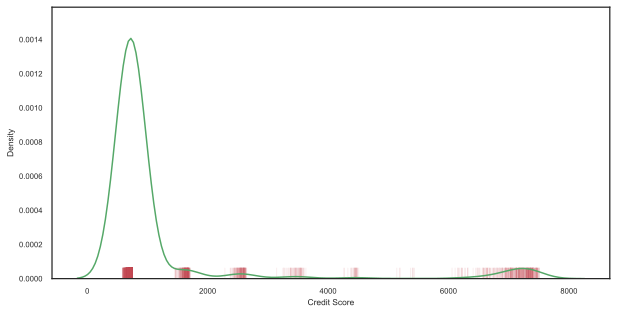

In [2521]:
# посмотрим на распределение признака Credit Score
plt.figure(figsize=(10, 5))

h_kws={"alpha": 0.5, "color": "r"}
k_kws={ "shade": False, "color": "g"}
r_kws={"alpha": 0.1, "height":0.04, "color": "r"}
sns.distplot(train_df['Credit Score'], bins=50, rug=True, hist=False, hist_kws=h_kws, kde_kws=k_kws, rug_kws=r_kws)

plt.xlabel('Credit Score')

plt.show()

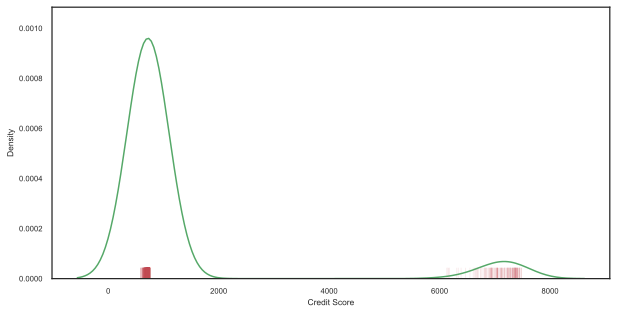

In [2522]:
# посмотрим на распределение признака Credit Score в тестовом наборе
plt.figure(figsize=(10, 5))

h_kws={"alpha": 0.5, "color": "r"}
k_kws={ "shade": False, "color": "g"}
r_kws={"alpha": 0.1, "height":0.04, "color": "r"}
sns.distplot(test_df['Credit Score'], bins=50, rug=True, hist=False, hist_kws=h_kws, kde_kws=k_kws, rug_kws=r_kws)

plt.xlabel('Credit Score')

plt.show()

In [2523]:
test_df.loc[test_df['Credit Score'] > 800, 'Credit Score'].count()

160

In [2524]:
train_df.loc[train_df['Credit Score'] > 800, ['Credit Score', 'Credit Default']].describe()

,Credit Score,Credit Default
count,867.000000,867.000000
mean,4550.185039,0.935409
std,2478.457692,0.245944
min,1451.142857,0.000000
25%,1684.285714,1.000000
50%,4329.000000,1.000000
75%,7170.000000,1.000000
max,7510.000000,1.000000


In [2525]:
train_df.loc[prep_df['Credit Score'] <= 800, ['Credit Score', 'Credit Default']].describe()

,Credit Score,Credit Default
count,7500.000000,7500.000000
mean,1163.968286,0.281733
std,1486.256082,0.449874
min,585.000000,0.000000
25%,714.714286,0.000000
50%,732.000000,0.000000
75%,744.000000,1.000000
max,7510.000000,1.000000


Очень похоже на то, что значения "второго пика" на графике справа вызваны ошибкой автоматического считывания, когда не распознался разделитель. То есть значение 650.0 превратилось в 6500. Что интересно, ВСЕ выбросы находятся в классе 1.0, то есть Credit Default = 1 для этих выбросов

Cоздадим новый признак - CS_outlier, в котором отметим строки, где были выбросы

In [2526]:
train_df['CS_outlier'] = 0
train_df.loc[train_df['Credit Score'] > 800, 'CS_outlier'] = 1

Присвоим выбросам значение минимума минус небольшое постоянное значение, для того чтобы эта группа стояла отдельно от основной массы наблюдений для упрощения моделям поиска значения разделения

In [2527]:
# обработаем выбросы по Credit Score
train_df.loc[train_df['Credit Score'] > 800, 'Credit Score'] = train_df['Credit Score'].min() - 10

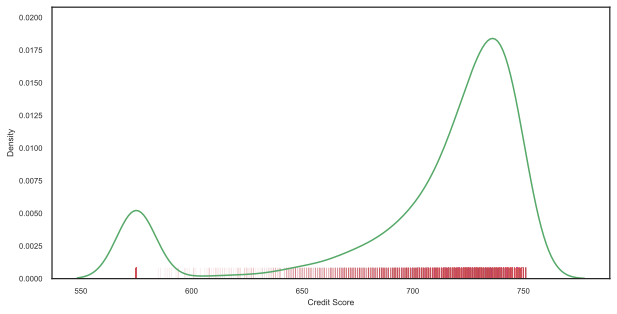

In [2528]:
# посмотрим на распределение признака Credit Score после обработки выбросов
plt.figure(figsize=(10, 5))

h_kws={"alpha": 0.5, "color": "r"}
k_kws={ "shade": False, "color": "g"}
r_kws={"alpha": 0.1, "height":0.04, "color": "r"}
sns.distplot(train_df['Credit Score'], bins=50, rug=True, hist=False, hist_kws=h_kws, kde_kws=k_kws, rug_kws=r_kws)

plt.xlabel('Credit Score')

plt.show()

##### Признак **Maximum Open Credit**

Признак - Maximum Open Credit имеет странные минимальные и максимальные значения. Посмотрим на распределение этого признака

In [2529]:
train_df['Maximum Open Credit'].describe()

count    7.500000e+03
mean     9.451537e+05
std      1.602622e+07
min      0.000000e+00
25%      2.792295e+05
50%      4.781590e+05
75%      7.935015e+05
max      1.304726e+09
Name: Maximum Open Credit, dtype: float64

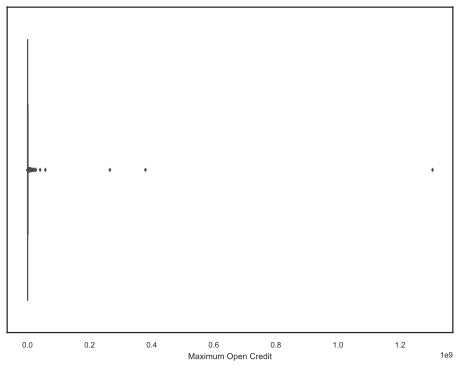

In [2530]:
# Построим ящик с усами
sns.boxplot(train_df['Maximum Open Credit'],  linewidth=1, fliersize=2, whis=1.5)

plt.xlabel('Maximum Open Credit')
plt.show()

In [2531]:
# посчитаем межквартильный размах для признака Maximum Open Credit, и максимальное и минимальное значения (значения "усов")
quart_range = train_df['Maximum Open Credit'].quantile(.75) - train_df['Maximum Open Credit'].quantile(.25)
whis, dev = 1.5, 0.0
min_quart = train_df['Maximum Open Credit'].quantile(.25) - (quart_range * (whis - dev))
max_quart = train_df['Maximum Open Credit'].quantile(.75) + (quart_range * (whis + dev))
quart_range, min_quart, max_quart, train_df['Maximum Open Credit'].quantile(.25), train_df['Maximum Open Credit'].quantile(.75)

(514272.0, -492178.5, 1564909.5, 279229.5, 793501.5)

In [2532]:
train_df.loc[train_df['Maximum Open Credit'] > max_quart, 'Maximum Open Credit'].count()

466

Таким образом выбросов - 466. Создадим дополнительный признак, отмечающий строки с выбросами

In [2533]:
# создадим новый призднак moc_outlier
train_df['moc_outlier'] = 0
train_df.loc[train_df['Maximum Open Credit'] > max_quart, 'moc_outlier'] = 1

Присвоим выбросам справа медианные значения. Альтернативный вариант - заменить выбросы предсказанными методом KNN

In [2534]:
# присвоим выбросам справа медианные значения
train_df.loc[train_df['Maximum Open Credit'] > max_quart, 'Maximum Open Credit'] = train_df['Maximum Open Credit'].median()

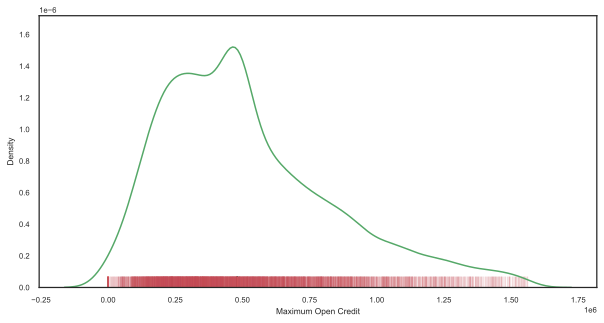

In [2535]:
# посмотрим на распределение признака Maximum Open Credit
plt.figure(figsize=(10, 5))

h_kws={"alpha": 0.5, "color": "r"}
k_kws={ "shade": False, "color": "g"}
r_kws={"alpha": 0.1, "height":0.04, "color": "r"}
sns.distplot(train_df['Maximum Open Credit'], bins=50, rug=True, hist=False, hist_kws=h_kws, kde_kws=k_kws, rug_kws=r_kws)

plt.xlabel('Maximum Open Credit')

plt.show()

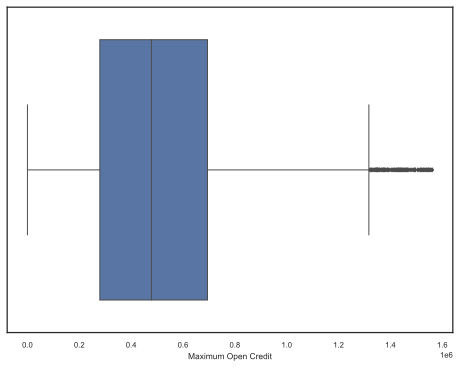

In [2536]:
sns.boxplot(train_df['Maximum Open Credit'],  linewidth=1, fliersize=2, whis=1.5)

plt.xlabel('Maximum Open Credit')
plt.show()

In [2537]:
train_df['Maximum Open Credit'].describe()

count    7.500000e+03
mean     5.205605e+05
std      3.222882e+05
min      0.000000e+00
25%      2.792295e+05
50%      4.781535e+05
75%      6.944795e+05
max      1.562550e+06
Name: Maximum Open Credit, dtype: float64

##### Признак - **Current Loan Amount**

In [2538]:
train_df['Current Loan Amount'].describe()

count    7.500000e+03
mean     1.187318e+07
std      3.192612e+07
min      1.124200e+04
25%      1.801690e+05
50%      3.095730e+05
75%      5.198820e+05
max      1.000000e+08
Name: Current Loan Amount, dtype: float64

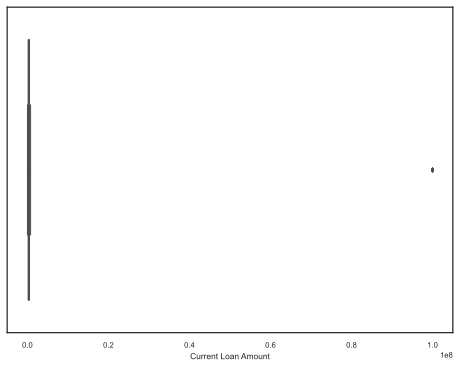

In [2539]:
# Построим ящик с усами
sns.boxplot(train_df['Current Loan Amount'],  linewidth=1, fliersize=2, whis=1.5)

plt.xlabel('Current Loan Amount')
plt.show()

In [2540]:
# посчитаем межквартильный размах для признака Current Loan Amount, и максимальное и минимальное значения (значения "усов")
quart_range_CLA = train_df['Current Loan Amount'].quantile(.75) - train_df['Current Loan Amount'].quantile(.25)
whis, dev = 1.5, 0.0
min_quart_CLA = train_df['Current Loan Amount'].quantile(.25) - (quart_range_CLA * (whis - dev))
max_quart_CLA = train_df['Current Loan Amount'].quantile(.75) + (quart_range_CLA * (whis + dev))
quart_range_CLA, min_quart_CLA, max_quart_CLA, train_df['Current Loan Amount'].quantile(.25), train_df['Current Loan Amount'].quantile(.75)

(339713.0, -329400.5, 1029451.5, 180169.0, 519882.0)

In [2541]:
train_df.loc[train_df['Current Loan Amount'] > max_quart_CLA, 'Current Loan Amount'].count()

870

In [2542]:
train_df.loc[train_df['Current Loan Amount'] > max_quart_CLA, ['Current Loan Amount','Credit Default']].describe()

,Current Loan Amount,Credit Default
count,870.0,870.0
mean,99999999.0,0.0
std,0.0,0.0
min,99999999.0,0.0
25%,99999999.0,0.0
50%,99999999.0,0.0
75%,99999999.0,0.0
max,99999999.0,0.0


Видим, что выбросы представляют собой одно и то же значение - 99 999 999 и таких выбросов 870 штук. ВСЕ значения выбросов имееют однозначное соответствие с целевой переменной - Credit Default = 0

In [2543]:
train_df.loc[train_df['Current Loan Amount'] < max_quart_CLA, ['Current Loan Amount','Credit Default']].describe()

,Current Loan Amount,Credit Default
count,6630.000000,6630.000000
mean,309024.390347,0.318703
std,182294.008621,0.466009
min,11242.000000,0.000000
25%,172744.000000,0.000000
50%,265826.000000,0.000000
75%,430100.000000,1.000000
max,789030.000000,1.000000


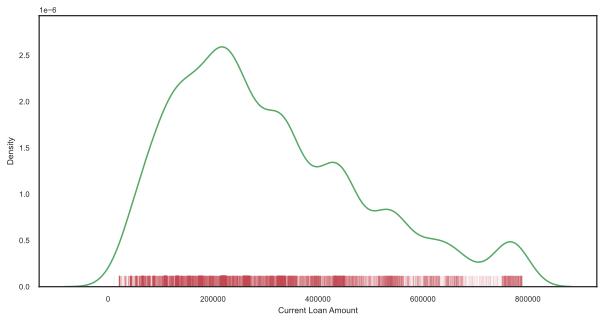

In [2544]:
# посмотрим на распределение Current Loan Amount < max_quart_CLA
plt.figure(figsize=(10, 5))

h_kws={"alpha": 0.5, "color": "r"}
k_kws={ "shade": False, "color": "g"}
r_kws={"alpha": 0.1, "height":0.04, "color": "r"}
sns.distplot(train_df.loc[train_df['Current Loan Amount'] < max_quart_CLA, 'Current Loan Amount'], \
             bins=50, rug=True, hist=False, hist_kws=h_kws, kde_kws=k_kws, rug_kws=r_kws)

plt.xlabel('Current Loan Amount')

plt.show()


In [2545]:
# Создадим дополнительный признак по выбросам признака Current Loan Amount
train_df['CLA_outlier'] = 0
train_df.loc[train_df['Current Loan Amount'] > max_quart_CLA, 'CLA_outlier'] = 1

In [2546]:
train_df.head()

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,...,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default,AI_CS_NaN,msld_nan,CS_outlier,moc_outlier,CLA_outlier
0,0,482087.0,1,0,11,26.3,685960.0,1,12,1,...,99999999.0,47386.0,7914.0,749.0,0,0,1,0,0,1
1,0,1025487.0,1,0,15,15.3,1181730.0,0,7,0,...,264968.0,394972.0,18373.0,737.0,1,0,1,0,0,0
2,1,751412.0,2,0,11,35.0,1182434.0,0,6,0,...,99999999.0,308389.0,13651.0,742.0,0,0,1,0,0,1
3,0,805068.0,3,0,8,22.5,147400.0,1,72,1,...,121396.0,95855.0,11338.0,694.0,0,0,1,0,0,0
4,2,776264.0,2,0,13,13.6,385836.0,1,2,0,...,125840.0,93309.0,7180.0,719.0,0,0,1,0,0,0


Присвоим выбросам значение максимума интерквартильного размаха плюс постоянную, для того чтобы эти значения находились в отдельной группе для того чтобы моделям проще было находить точку разделения

In [2547]:
max_cla = train_df.loc[train_df['Current Loan Amount'] < max_quart_CLA, 'Current Loan Amount'].max() + 100000
max_cla

889030.0

In [2548]:
# присвоим выбросам по признаку Current Loan Amount значение медианы (альтернатива - махimum +1)
train_df.loc[train_df['Current Loan Amount'] > max_quart_CLA, 'Current Loan Amount'] = max_cla

In [2549]:
train_df.loc[train_df['CLA_outlier'] == 1, ['Current Loan Amount', 'CLA_outlier']]

,Current Loan Amount,CLA_outlier
0,889030.0,1
2,889030.0,1
6,889030.0,1
22,889030.0,1
27,889030.0,1
...,...,...
7441,889030.0,1
7445,889030.0,1
7464,889030.0,1
7475,889030.0,1


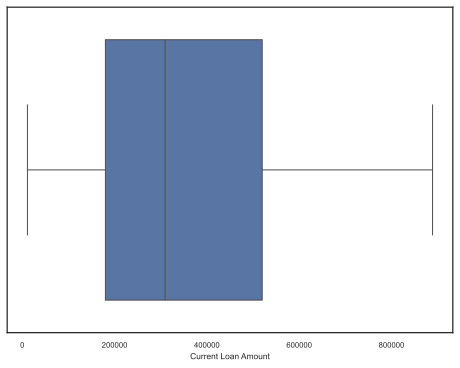

In [2550]:
# Построим ящик с усами
sns.boxplot(train_df['Current Loan Amount'],  linewidth=1, fliersize=2, whis=1.5)

plt.xlabel('Current Loan Amount')
plt.show()

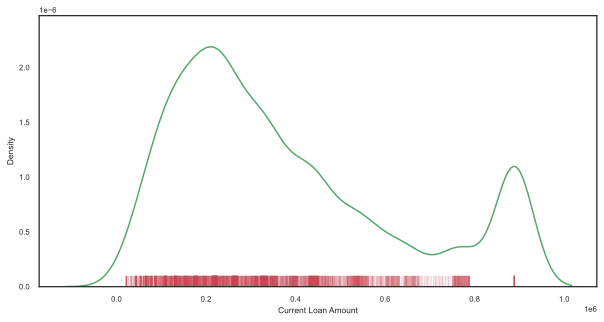

In [2551]:
# посмотрим на распределение Current Loan Amount < max_quart_CLA
plt.figure(figsize=(10, 5))

h_kws={"alpha": 0.5, "color": "r"}
k_kws={ "shade": False, "color": "g"}
r_kws={"alpha": 0.1, "height":0.04, "color": "r"}
sns.distplot(train_df['Current Loan Amount'], \
             bins=50, rug=True, hist=False, hist_kws=h_kws, kde_kws=k_kws, rug_kws=r_kws)

plt.xlabel('Current Loan Amount')

plt.show()

In [2552]:
train_df['Current Loan Amount'].describe()

count      7500.000000
mean     376305.041067
std      252738.703623
min       11242.000000
25%      180169.000000
50%      309573.000000
75%      519882.000000
max      889030.000000
Name: Current Loan Amount, dtype: float64



---


**У нас есть все, чтобы попробовать построить первую модель и получить базовую оценку метрик.**

### Сохранение обучающего датасета

In [2553]:
train_df.to_csv(PREP_DATASET_PATH, index=False, encoding='utf-8')

### Анализ и обработка данных





In [2554]:
# загрузим подготовленные данные
prep_df = pd.read_csv(PREP_DATASET_PATH)

In [2555]:
prep_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7500 entries, 0 to 7499
Data columns (total 22 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Home Ownership                7500 non-null   int64  
 1   Annual Income                 7500 non-null   float64
 2   Years in current job          7500 non-null   int64  
 3   Tax Liens                     7500 non-null   int64  
 4   Number of Open Accounts       7500 non-null   int64  
 5   Years of Credit History       7500 non-null   float64
 6   Maximum Open Credit           7500 non-null   float64
 7   Number of Credit Problems     7500 non-null   int64  
 8   Months since last delinquent  7500 non-null   int64  
 9   Bankruptcies                  7500 non-null   int64  
 10  Purpose                       7500 non-null   int64  
 11  Term                          7500 non-null   int64  
 12  Current Loan Amount           7500 non-null   float64
 13  Cur

#### Анализ целевой переменной

**Посмотрим распределение целевой переменной**

In [2556]:
target_name = 'Credit Default'
prep_df[target_name].value_counts()

0    5387
1    2113
Name: Credit Default, dtype: int64

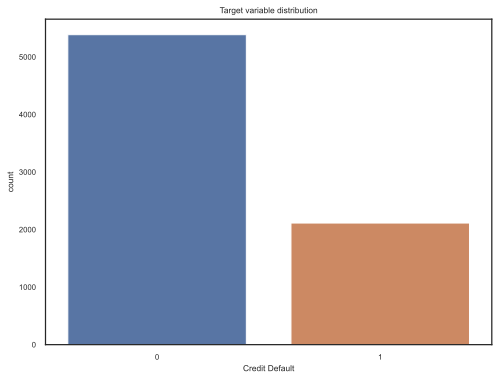

In [2557]:
#plt.figure(figsize=(8, 5))

sns.countplot(x=target_name, data=prep_df)

plt.title('Target variable distribution')
plt.show()

**Посмотрим корреляцию целевой переменной с признаками**

In [2558]:
features_list = prep_df.columns.drop(target_name).tolist()


In [2559]:
prep_df[features_list + [target_name]].corr().iloc[:-1, -1].sort_values(ascending=False)


CS_outlier                      0.525358
Term                            0.181487
AI_CS_NaN                       0.066020
Home Ownership                  0.042611
Number of Open Accounts         0.028884
Tax Liens                       0.024368
Number of Credit Problems       0.020088
Monthly Debt                    0.018480
Purpose                         0.016020
Bankruptcies                    0.001606
Years in current job           -0.007078
Months since last delinquent   -0.007110
msld_nan                       -0.011756
Current Credit Balance         -0.019522
Years of Credit History        -0.020567
moc_outlier                    -0.043328
Maximum Open Credit            -0.048613
Annual Income                  -0.098436
Current Loan Amount            -0.123052
CLA_outlier                    -0.226871
Credit Score                   -0.547344
Name: Credit Default, dtype: float64

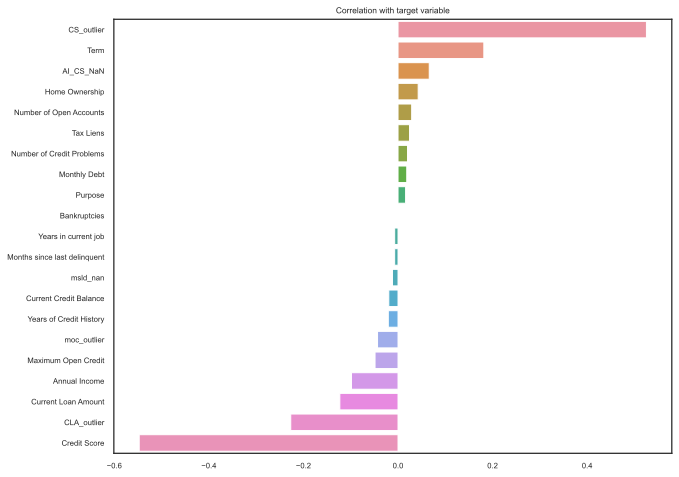

In [2560]:
corr_with_target = prep_df[features_list + [target_name]].corr().iloc[:-1, -1].sort_values(ascending=False)

plt.figure(figsize=(10, 8))

sns.barplot(x=corr_with_target.values, y=corr_with_target.index)

plt.title('Correlation with target variable')
plt.show()

Наблюдения

Видны признаки с сильной корреляцией с целевой переменной. Эти признаки будем исследовать более внимательно. Скорее всего это сильные признаки, которые точно нужно будет использовать в модели

**Начнем исследования признаков на предмет влияния на целевую переменную**

In [2561]:
prep_df.columns.drop(target_name).tolist()

['Home Ownership',
 'Annual Income',
 'Years in current job',
 'Tax Liens',
 'Number of Open Accounts',
 'Years of Credit History',
 'Maximum Open Credit',
 'Number of Credit Problems',
 'Months since last delinquent',
 'Bankruptcies',
 'Purpose',
 'Term',
 'Current Loan Amount',
 'Current Credit Balance',
 'Monthly Debt',
 'Credit Score',
 'AI_CS_NaN',
 'msld_nan',
 'CS_outlier',
 'moc_outlier',
 'CLA_outlier']

In [2562]:
# определим категориальные и количественные признаки
# список категориальных признаков
cat_features_list = ['Home Ownership', 'Years in current job', 'Tax Liens', 'Number of Credit Problems', \
                     'Bankruptcies', 'Purpose', 'Term', 'AI_CS_NaN', 'CS_outlier', 'msld_nan', 'moc_outlier']
# список количественных признаков
# Number of Open Accounts, Months since last delinquent, - хоть и целые, но число уникальных вариантов количеств счетов = 39, а месяцев =  относим эти признаки к количественным
num_features_list = ['Annual Income', 'Number of Open Accounts', 'Years of Credit History', 'Maximum Open Credit', \
                      'Months since last delinquent', 'Current Loan Amount', 'Current Credit Balance', 'Monthly Debt', 'Credit Score']

#### Обзор категориальных признаков

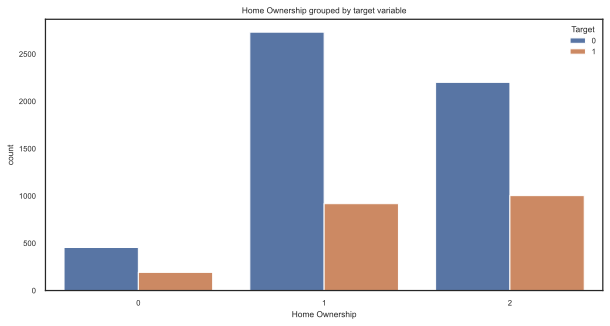

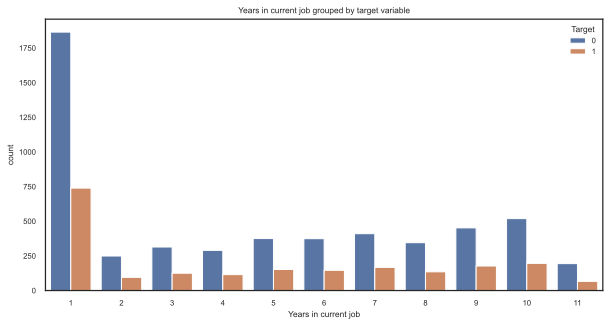

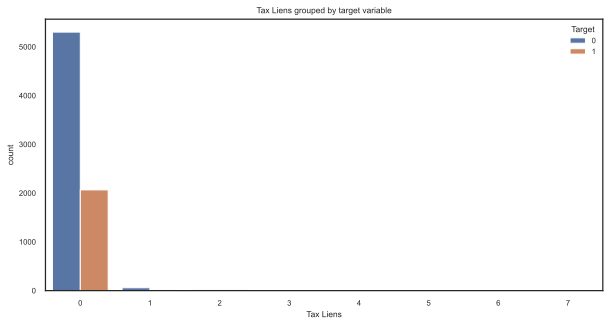

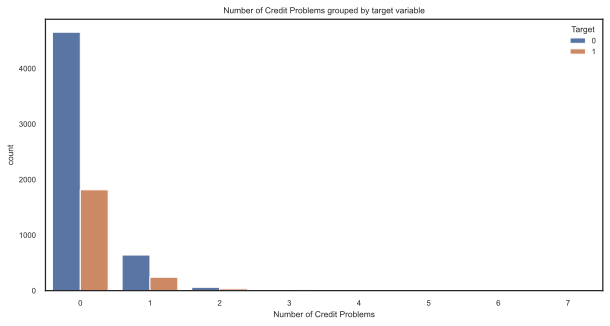

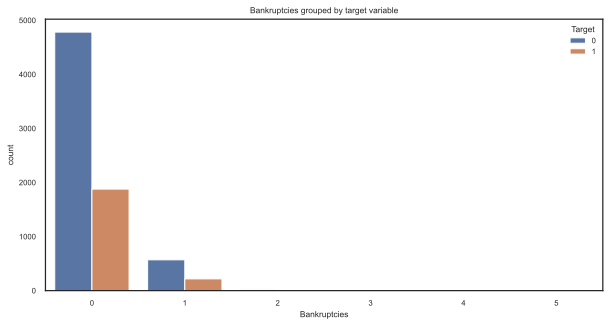

...

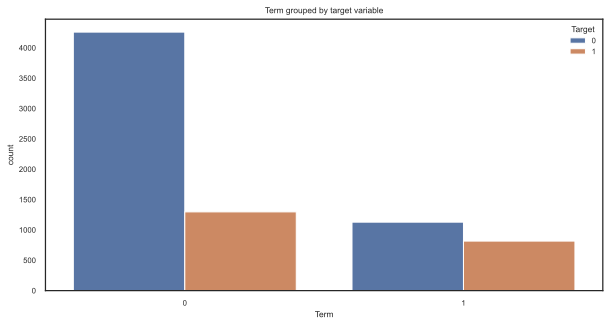

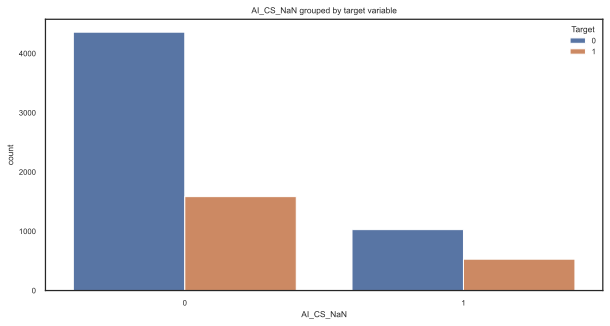

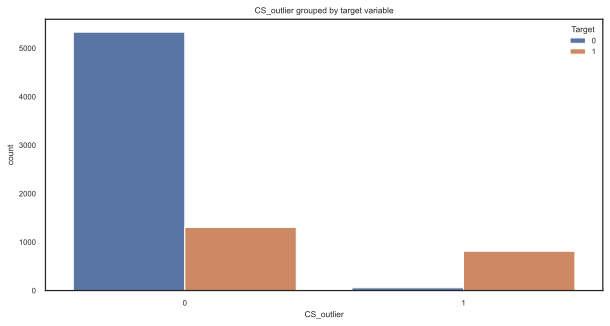

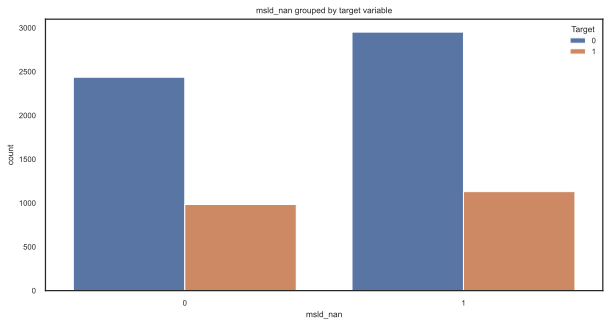

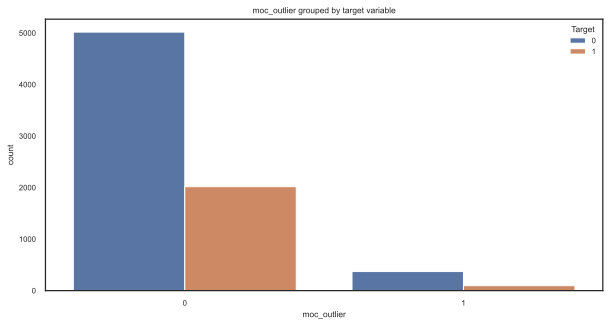

In [2563]:
# построим графики для категориальных признаков
for feature in cat_features_list:
  plt.figure(figsize=(10, 5))
  sns.countplot(x=feature, hue=target_name, data=prep_df)
  plt.title(feature + ' grouped by target variable')
  plt.legend(title='Target', loc='upper right')

##### Home Ownership

In [2564]:
ho_0_cd_0 = prep_df.loc[(prep_df['Home Ownership'] == 0) & (prep_df['Credit Default'] == 0), 'Home Ownership'].count()
ho_0_cd_1 = prep_df.loc[(prep_df['Home Ownership'] == 0) & (prep_df['Credit Default'] == 1), 'Home Ownership'].count()
print(ho_0_cd_0, ho_0_cd_1)
ho_1_cd_0 = prep_df.loc[(prep_df['Home Ownership'] == 1) & (prep_df['Credit Default'] == 0), 'Home Ownership'].count()
ho_1_cd_1 = prep_df.loc[(prep_df['Home Ownership'] == 1) & (prep_df['Credit Default'] == 1), 'Home Ownership'].count()
print(ho_1_cd_0, ho_1_cd_1)
ho_2_cd_0 = prep_df.loc[(prep_df['Home Ownership'] == 2) & (prep_df['Credit Default'] == 0), 'Home Ownership'].count()
ho_2_cd_1 = prep_df.loc[(prep_df['Home Ownership'] == 2) & (prep_df['Credit Default'] == 1), 'Home Ownership'].count()
print(ho_2_cd_0, ho_2_cd_1)

455 192
2731 918
2201 1003


**Наблюдение**
Из графика видно что значения Home OwnerShip 0 и 2 имеют схожие доли в разрезе целевой переменной. Проверим эту гипотезу.

**Гипотеза**

Нулевая гипотеза: ожидаемые и наблюдаемые частоты согласованы

Альтернативная гипотеза: отклонения в частотах выходят за рамки случайных колебаний, расхождения статистически значимы

Критерий: Хи-квадрат Пирсона

Уровень значимости 
α
=
0.05
 
Критическая область: двухсторонняя

Для проверки данной гипотезы необходимо подать наблюдаемые частоты категорий 0 и 2 признака Рщьу Ownership в выбранный критерий, после чего оценить значение достигаемого уровня значимости p-value и сравнить с его с выбранным порогом альфа. 
Если p-value получится больше выбранного порога, то гипотезу о согласованности частот можно не отбрасывать.

*Сформируем выборку и рассчитаем наблюдаемые частоты*

In [2565]:
ho_and_target = prep_df.loc[prep_df['Home Ownership'].isin([0, 2]), ['Home Ownership', 'Credit Default']]
ho_and_target['id'] = ho_and_target.index
ho_and_target

,Home Ownership,Credit Default,id
0,0,0,0
1,0,1,1
3,0,0,3
4,2,0,4
5,2,1,5
...,...,...,...
7493,2,1,7493
7494,0,0,7494
7495,2,0,7495
7497,2,0,7497


In [2566]:
table = ho_and_target.pivot_table(values='id', 
                                    index='Home Ownership', 
                                    columns='Credit Default', 
                                    aggfunc='count')
table

Credit Default,0,1
Home Ownership,,
0,455,192
2,2201,1003


In [2567]:
chi2, p, dof, expected = chi2_contingency(table, correction=False)
p

0.41388761719718237

In [2568]:
p > 0.05

True

Проверим теперь категории 1 и 2 на согласованность

In [2569]:
ho_and_target_1 = prep_df.loc[prep_df['Home Ownership'].isin([1, 2]), ['Home Ownership', 'Credit Default']]
ho_and_target_1['id'] = ho_and_target_1.index
ho_and_target_1

,Home Ownership,Credit Default,id
2,1,0,2
4,2,0,4
5,2,1,5
6,1,0,6
7,2,1,7
...,...,...,...
7495,2,0,7495
7496,1,1,7496
7497,2,0,7497
7498,1,0,7498


In [2570]:
table_1 = ho_and_target_1.pivot_table(values='id', 
                                    index='Home Ownership', 
                                    columns='Credit Default', 
                                    aggfunc='count')
table_1

Credit Default,0,1
Home Ownership,,
1,2731,918
2,2201,1003


In [2571]:
chi2, p, dof, expected = chi2_contingency(table_1, correction=False)
p

1.5784440464348652e-08

In [2572]:
p > 0.05

False

**Вывод:**
Значения признака Home Ownership равные 0 и 2 согласованы и их можно объединить в одно значение, так как их влияние на целевую переменную статистически одинаково. Категории 1 и 2 не согласованы и объединять их нельзя.

In [2573]:
prep_df['Home Ownership'].value_counts()

1    3649
2    3204
0     647
Name: Home Ownership, dtype: int64

In [2574]:
prep_df.loc[prep_df['Home Ownership'] == 0, 'Home Ownership'] = 2

In [2575]:
prep_df['Home Ownership'].value_counts()

2    3851
1    3649
Name: Home Ownership, dtype: int64

#### Обзор количественных признаков

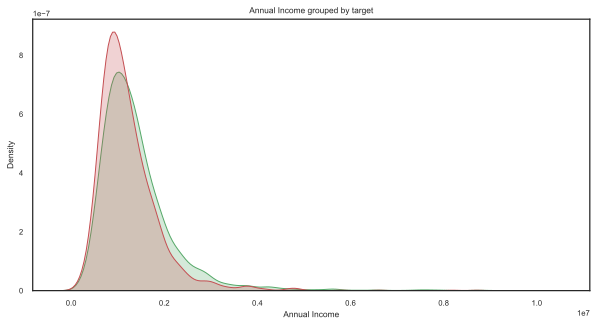

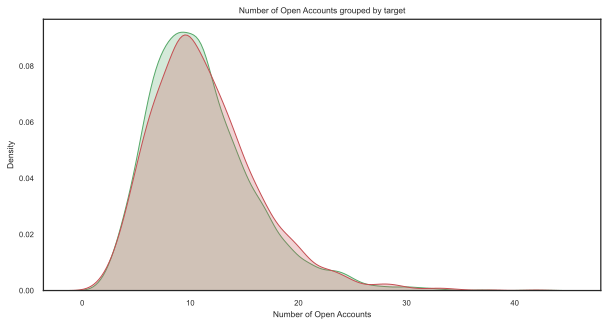

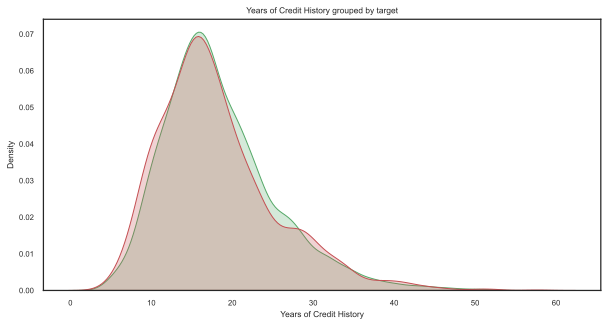

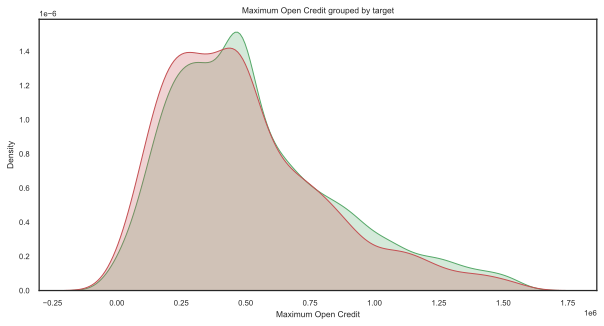

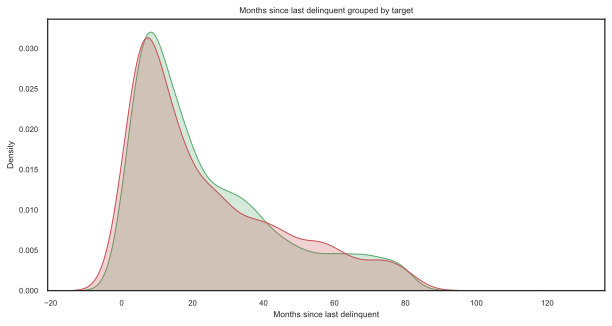

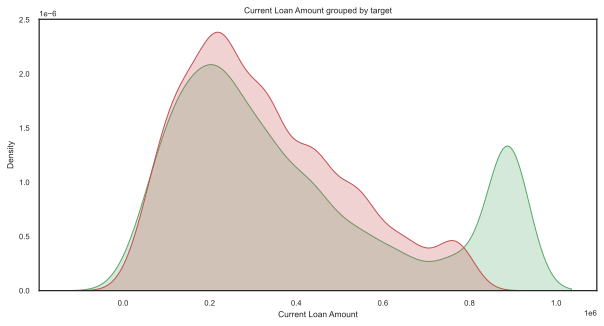

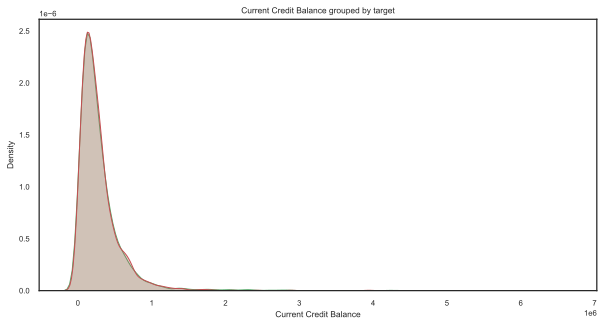

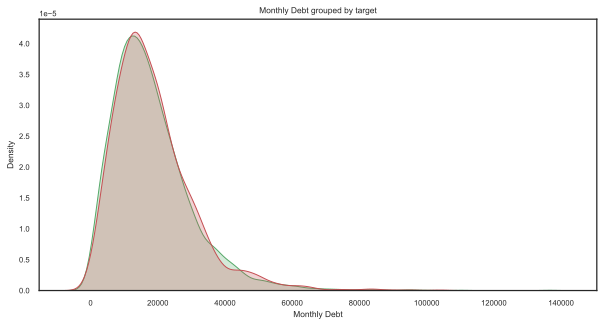

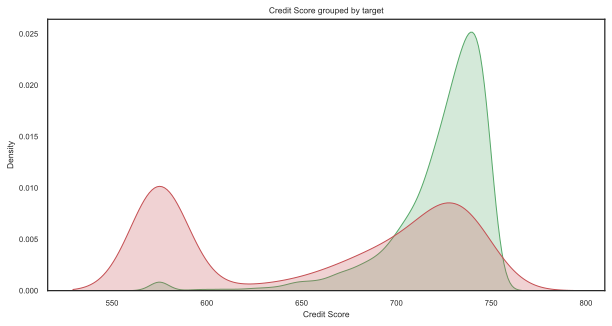

In [2576]:
# построим графики для количественных признаков
for feature in num_features_list:
    feature_with_target = prep_df[[feature, target_name]]
    feature_sample = feature_with_target[feature]
    feature_with_target_0 = feature_sample[feature_with_target[target_name] == 0]
    feature_with_target_1 = feature_sample[feature_with_target[target_name] == 1]
    
    plt.figure(figsize=(10, 5))

    sns.kdeplot(feature_with_target_0, shade=True, label='No default', color='g')
    sns.kdeplot(feature_with_target_1, shade=True, label='Default', color='r')

    plt.xlabel(feature)
    plt.title(feature + ' grouped by target');

#### Анализ корреляций признаков

**Матрица корреляций признаков**

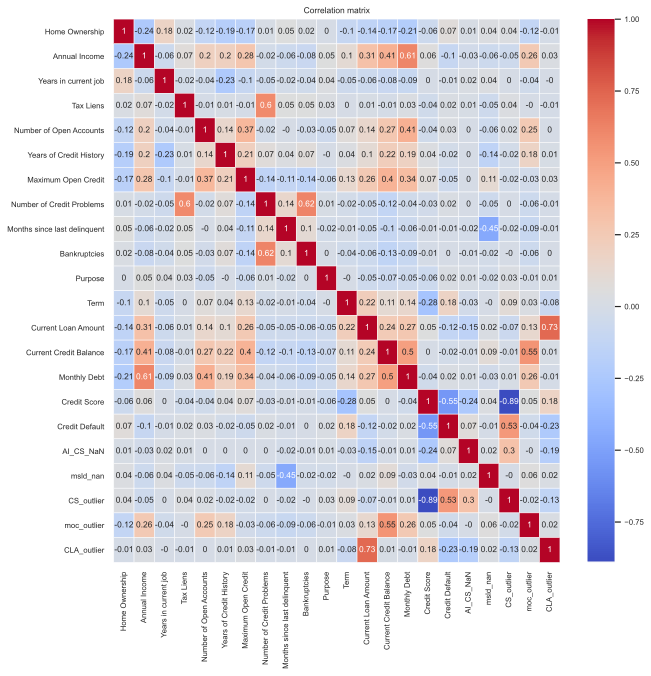

In [2577]:
plt.figure(figsize = (10,10))


sns.set(font_scale=0.7)
sns.heatmap(prep_df.corr().round(2), annot=True, linewidths=.5, cmap='coolwarm')
plt.title('Correlation matrix');

### Выделение целевой переменной и групп признаков

### Отбор признаков

In [2578]:
prep_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7500 entries, 0 to 7499
Data columns (total 22 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Home Ownership                7500 non-null   int64  
 1   Annual Income                 7500 non-null   float64
 2   Years in current job          7500 non-null   int64  
 3   Tax Liens                     7500 non-null   int64  
 4   Number of Open Accounts       7500 non-null   int64  
 5   Years of Credit History       7500 non-null   float64
 6   Maximum Open Credit           7500 non-null   float64
 7   Number of Credit Problems     7500 non-null   int64  
 8   Months since last delinquent  7500 non-null   int64  
 9   Bankruptcies                  7500 non-null   int64  
 10  Purpose                       7500 non-null   int64  
 11  Term                          7500 non-null   int64  
 12  Current Loan Amount           7500 non-null   float64
 13  Cur

Определим категориальные и количественные признаки

In [2579]:
# список категориальных признаков
cat_features_list = ['Home Ownership', 
                     'Years in current job', 
                     'Tax Liens', 
                     'Number of Credit Problems',
                     'Bankruptcies', 
                     'Purpose', 
                     'Term', 
                     'AI_CS_NaN', 
                     #'msld_nan',
                     'CS_outlier',
                     #'moc_outlier',
                     #'CLA_outlier',
                     #'yearsCH_bins',
                     #'New_YearsCH',
                     #'Number of Open Accounts',
                     'Credit Score',
                     #'Months since last delinquent', 
                     ]


In [2580]:
# список количественных признаков
# Number of Open Accounts, Months since last delinquent, - хоть и целые, но число уникальных вариантов количеств счетов = 39, 
# а месяцев = 90. Отнесем эти признаки к количественным
num_features_list = [
                     'Annual Income', 
                     'Number of Open Accounts', 
                     'Years of Credit History', 
                     'Maximum Open Credit',
                     'Months since last delinquent', 
                     'Current Loan Amount', 
                     'Current Credit Balance', 
                     'Monthly Debt', 
                     #'Credit Score',
                     #'Income Debt'
                     ]

In [2581]:
# отбираем признаки для работы.
selected_features_list = cat_features_list + num_features_list
selected_features_list, len(selected_features_list)

(['Home Ownership',
  'Years in current job',
  'Tax Liens',
  'Number of Credit Problems',
  'Bankruptcies',
  'Purpose',
  'Term',
  'AI_CS_NaN',
  'CS_outlier',
  'Credit Score',
  'Annual Income',
  'Number of Open Accounts',
  'Years of Credit History',
  'Maximum Open Credit',
  'Months since last delinquent',
  'Current Loan Amount',
  'Current Credit Balance',
  'Monthly Debt'],
 18)

In [2582]:
prep_df['Credit Score'] = prep_df['Credit Score'].astype(int)


### Разбиение на train и test

In [2583]:
# отделим набор признаков и целевую переменную
target_name = 'Credit Default'
X = prep_df[selected_features_list]
y = prep_df[target_name]

In [2584]:
# разбиваем набор данных на тренировочный и тестовый.
X_train_base, X_valid_base, y_train_base, y_valid_base = train_test_split(X, y, test_size=2500, shuffle=True, random_state=21)
X_train_base.shape, X_valid_base.shape

((5000, 18), (2500, 18))

### Оценка качества данных

Оценка по модели CatBoost

In [2585]:
scale = int(y_train_base[y_train_base == 0].shape[0] / y_train_base[y_train_base == 1].shape[0])
scale

2

In [2586]:
%%time

model_catb = catb.CatBoostClassifier(scale_pos_weight=scale, silent=True, random_state=21,
                                     #l2_leaf_reg=0,
                                     )
model_catb.fit(X_train_base, y_train_base, cat_features=cat_features_list)

y_train_base_pred = model_catb.predict(X_train_base)
y_valid_base_pred = model_catb.predict(X_valid_base)
#y_valid_pred_probs = model_catb.predict_proba(X_valid_base)

get_classification_report(y_train_base, y_train_base_pred, y_valid_base, y_valid_base_pred)

TRAIN

              precision    recall  f1-score   support

           0       0.90      0.95      0.93      3591
           1       0.86      0.74      0.80      1409

    accuracy                           0.89      5000
   macro avg       0.88      0.85      0.86      5000
weighted avg       0.89      0.89      0.89      5000

TEST

              precision    recall  f1-score   support

           0       0.84      0.91      0.87      1796
           1       0.71      0.55      0.62       704

    accuracy                           0.81      2500
   macro avg       0.78      0.73      0.75      2500
weighted avg       0.80      0.81      0.80      2500

CONFUSION MATRIX

col_0              0    1
Credit Default           
0               1639  157
1                315  389
CPU times: user 21.1 s, sys: 2.51 s, total: 23.6 s
Wall time: 19 s


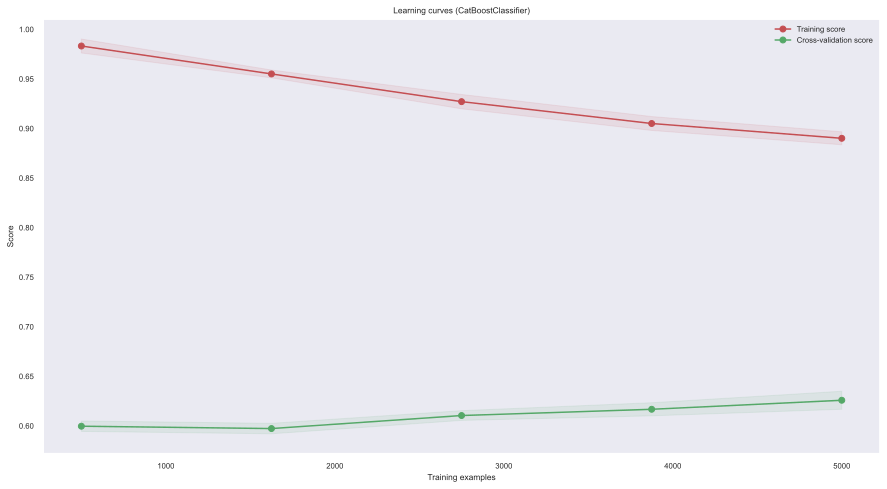

In [2587]:
show_learning_curve_plot(model_catb, X, y)

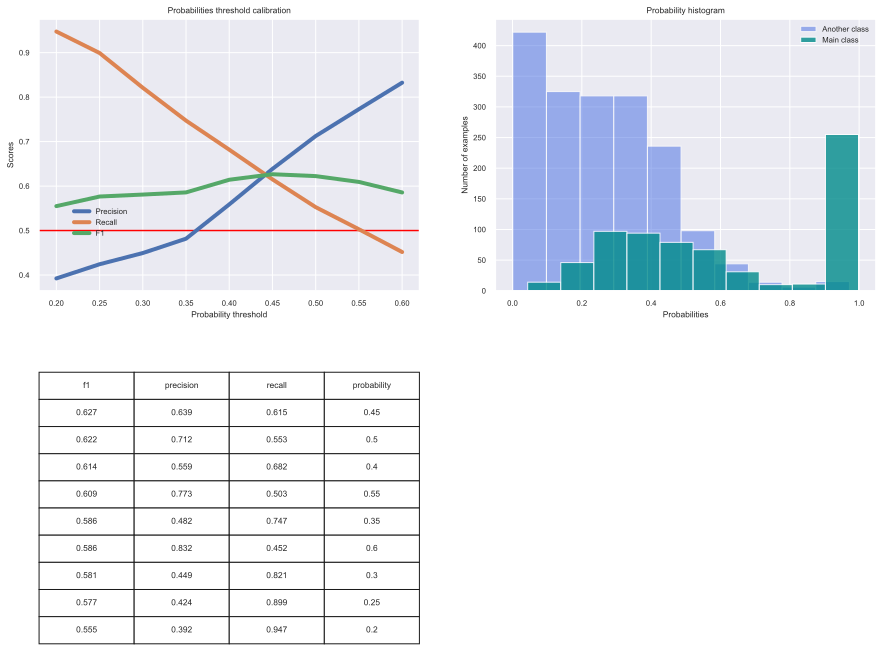

In [2588]:
y_test_pred_probs = model_catb.predict_proba(X_valid_base)[:, 1]
show_proba_calibration_plots(y_test_pred_probs, y_valid_base)

In [2589]:
y_test_labels = np.array(y_test_pred_probs > 0.45, dtype=int)
y_test_labels


array([0, 0, 1, ..., 0, 0, 0])

In [2590]:
get_classification_report(y_train_base, y_train_base_pred, y_valid_base, y_test_labels)

TRAIN

              precision    recall  f1-score   support

           0       0.90      0.95      0.93      3591
           1       0.86      0.74      0.80      1409

    accuracy                           0.89      5000
   macro avg       0.88      0.85      0.86      5000
weighted avg       0.89      0.89      0.89      5000

TEST

              precision    recall  f1-score   support

           0       0.85      0.86      0.86      1796
           1       0.64      0.62      0.63       704

    accuracy                           0.79      2500
   macro avg       0.74      0.74      0.74      2500
weighted avg       0.79      0.79      0.79      2500

CONFUSION MATRIX

col_0              0    1
Credit Default           
0               1551  245
1                271  433


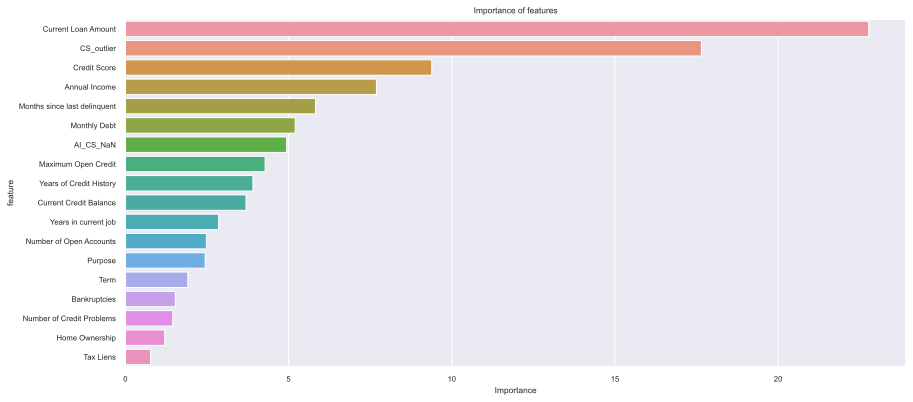

In [2591]:
important_features_top = show_feature_importances(X_train_base.columns, 
                                                  model_catb.feature_importances_, 
                                                  #get_top=15
                                                  )

In [2592]:
# проведем кросс-валидацию
cv_score = cross_val_score(model_catb, X_train_base, y_train_base, scoring='f1', cv=KFold(n_splits=5, shuffle=True, random_state=21))
cv_score

array([0.63216266, 0.61386139, 0.59557344, 0.60629921, 0.59756098])

In [2593]:
cv_score.mean()

0.6090915353456363

#### Настройка гипер параметров модели Catboost

In [2594]:
# загрузим подготовленные данные
prep_df = pd.read_csv(PREP_DATASET_PATH)
# загрузим базовый датасет
df_base = pd.read_csv(TRAIN_DATASET_PATH)

In [2595]:
# проведем предварительную обработку данных
preprocessor = DataPreprocessing()
preprocessor.fit(df_base)
preprocessor.transform(df_base)
df_base.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7500 entries, 0 to 7499
Data columns (total 19 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Home Ownership                7500 non-null   int64  
 1   Annual Income                 7500 non-null   float64
 2   Years in current job          7500 non-null   int64  
 3   Tax Liens                     7500 non-null   int64  
 4   Number of Open Accounts       7500 non-null   int64  
 5   Years of Credit History       7500 non-null   float64
 6   Maximum Open Credit           7500 non-null   float64
 7   Number of Credit Problems     7500 non-null   int64  
 8   Months since last delinquent  7500 non-null   int64  
 9   Bankruptcies                  7500 non-null   int64  
 10  Purpose                       7500 non-null   int64  
 11  Term                          7500 non-null   int64  
 12  Current Loan Amount           7500 non-null   float64
 13  Cur

In [2596]:

X = df_base[selected_features_list]
y = df_base[target_name]

X_train_base, X_valid_base, y_train_base, y_valid_base = train_test_split(X, y, test_size=2500, shuffle=True, random_state=21)
X_train_base.shape, X_valid_base.shape, y_train_base.shape, y_valid_base.shape

((5000, 18), (2500, 18), (5000,), (2500,))

In [2597]:
cat_features = [i for i, col in enumerate(cat_features_list) if col in cat_features_list]
cat_features

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

In [2598]:
X_train_base[selected_features_list].iloc[:,cat_features].columns

Index(['Home Ownership', 'Years in current job', 'Tax Liens',
       'Number of Credit Problems', 'Bankruptcies', 'Purpose', 'Term',
       'AI_CS_NaN', 'CS_outlier', 'Credit Score'],
      dtype='object')

In [2599]:
scale = int(y_train_base[y_train_base == 0].shape[0] / y_train_base[y_train_base == 1].shape[0])
scale

2

In [2600]:
model_catb = catb.CatBoostClassifier(n_estimators=100,
                                     custom_loss=['F1'],
                                     silent=True, 
                                     random_state=21)
grid = {
    'learning_rate': [0.05, 0.1],
    'depth':[4, 6, 8, 10]
}
train_pool = Pool(data=X_train_base, label=y_train_base, cat_features=cat_features)
test_pool = Pool(data=X_valid_base, label=y_valid_base, cat_features=cat_features)

grid_search_results = model_catb.grid_search(grid, train_pool, cv=3, stratified=True,
                                             verbose=False, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


bestTest = 0.4181020623
bestIteration = 99


bestTest = 0.4100317656
bestIteration = 96


bestTest = 0.4123960966
bestIteration = 99


bestTest = 0.4060107462
bestIteration = 99


bestTest = 0.4138884186
bestIteration = 99


bestTest = 0.4127358076
bestIteration = 73


bestTest = 0.4135749105
bestIteration = 99


bestTest = 0.4113427083
bestIteration = 72



In [2601]:
grid_search_results['params']

{'depth': 6, 'learning_rate': 0.1}

In [2602]:
final_model = catb.CatBoostClassifier(n_estimators=1000, 
                                      max_depth=6, 
                                      scale_pos_weight=scale,
                                      silent=True, 
                                      random_state=21, 
                                      early_stopping_rounds=20,
                                      eval_metric='F1', # оптимизируем метрику
                                      learning_rate=0.1
                                     )
final_model.fit(X_train_base, y_train_base, cat_features=cat_features,
               eval_set=(X_valid_base, y_valid_base))

y_train_pred = final_model.predict(X_train_base)
y_test_pred = final_model.predict(X_valid_base)

get_classification_report(y_train_base, y_train_base_pred, y_valid_base, y_valid_base_pred)

TRAIN

              precision    recall  f1-score   support

           0       0.90      0.95      0.93      3591
           1       0.86      0.74      0.80      1409

    accuracy                           0.89      5000
   macro avg       0.88      0.85      0.86      5000
weighted avg       0.89      0.89      0.89      5000

TEST

              precision    recall  f1-score   support

           0       0.84      0.91      0.87      1796
           1       0.71      0.55      0.62       704

    accuracy                           0.81      2500
   macro avg       0.78      0.73      0.75      2500
weighted avg       0.80      0.81      0.80      2500

CONFUSION MATRIX

col_0              0    1
Credit Default           
0               1639  157
1                315  389


In [2603]:
print('Количество деревьев: ', final_model.tree_count_)
print('Accuracy на обучающей выборке: {:.3}'.format(final_model.score(X_train_base, y_train_base)))
print('Accuracy на проверочной выборке: {:.3}'.format(final_model.score(X_valid_base, y_valid_base)))

Количество деревьев:  1
Accuracy на обучающей выборке: 0.786
Accuracy на проверочной выборке: 0.79


## Финальная модель

### Загрузка данных

In [2604]:
train_df = pd.read_csv(TRAIN_DATASET_PATH)
test_df = pd.read_csv(TEST_DATASET_PATH)

### Обработка данных


In [2605]:
# создаем экземпляр класс обработки данных
preprocessor = DataPreprocessing()
# рассчитываем статистику и необходимую для преобразований информацию
preprocessor.fit(train_df)
# обработаем данные на тренировочном наборе данных 
preprocessor.transform(train_df)
# обработаем данные на тестовом наборе 
preprocessor.transform(test_df)
# быстрая визуальная проверка
train_df.info(), test_df.info()
# создаем датасет для обучения на выбранных признаках
X = train_df[selected_features_list]
# создаем датасет с целевой переменной для проверки
y = train_df[target_name]
# создаем набор для передачи в модель для предсказаний (можно было и некопировать)
X_test = test_df.copy()
# разбиваем тренировочный набор данных для последней проверки
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=2500, shuffle=True, random_state=22)




<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7500 entries, 0 to 7499
Data columns (total 19 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Home Ownership                7500 non-null   int64  
 1   Annual Income                 7500 non-null   float64
 2   Years in current job          7500 non-null   int64  
 3   Tax Liens                     7500 non-null   int64  
 4   Number of Open Accounts       7500 non-null   int64  
 5   Years of Credit History       7500 non-null   float64
 6   Maximum Open Credit           7500 non-null   float64
 7   Number of Credit Problems     7500 non-null   int64  
 8   Months since last delinquent  7500 non-null   int64  
 9   Bankruptcies                  7500 non-null   int64  
 10  Purpose                       7500 non-null   int64  
 11  Term                          7500 non-null   int64  
 12  Current Loan Amount           7500 non-null   float64
 13  Cur

#### Последняя проверка и борьба с переобучением

In [2606]:
final_model = catb.CatBoostClassifier(n_estimators=100, 
                                      max_depth=6, 
                                      scale_pos_weight=scale,
                                      early_stopping_rounds=20,
                                      l2_leaf_reg=30,
                                      silent=True, 
                                      random_state=22,
                                      learning_rate=0.1)

final_model.fit(X_train, y_train)

y_train_pred = final_model.predict(X_train)
y_valid_pred = final_model.predict(X_valid)

get_classification_report(y_train, y_train_pred, y_valid, y_valid_pred)

TRAIN

              precision    recall  f1-score   support

           0       0.85      0.91      0.88      3608
           1       0.72      0.57      0.64      1392

    accuracy                           0.82      5000
   macro avg       0.78      0.74      0.76      5000
weighted avg       0.81      0.82      0.81      5000

TEST

              precision    recall  f1-score   support

           0       0.83      0.91      0.87      1779
           1       0.70      0.53      0.60       721

    accuracy                           0.80      2500
   macro avg       0.76      0.72      0.73      2500
weighted avg       0.79      0.80      0.79      2500

CONFUSION MATRIX

col_0              0    1
Credit Default           
0               1618  161
1                342  379


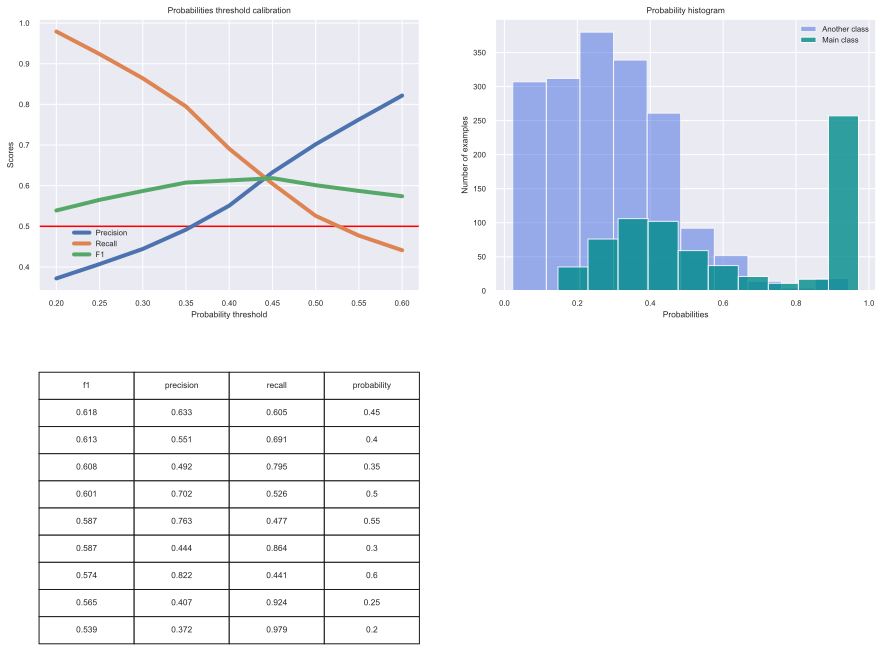

In [2607]:
y_valid_pred_probs = final_model.predict_proba(X_valid)[:, 1]
show_proba_calibration_plots(y_valid_pred_probs, y_valid)

In [2608]:
y_valid_labels = np.array(y_valid_pred_probs > 0.45, dtype=int)

In [2609]:
get_classification_report(y_train, y_train_pred, y_valid, y_valid_labels)

TRAIN

              precision    recall  f1-score   support

           0       0.85      0.91      0.88      3608
           1       0.72      0.57      0.64      1392

    accuracy                           0.82      5000
   macro avg       0.78      0.74      0.76      5000
weighted avg       0.81      0.82      0.81      5000

TEST

              precision    recall  f1-score   support

           0       0.84      0.86      0.85      1779
           1       0.63      0.60      0.62       721

    accuracy                           0.78      2500
   macro avg       0.74      0.73      0.73      2500
weighted avg       0.78      0.78      0.78      2500

CONFUSION MATRIX

col_0              0    1
Credit Default           
0               1526  253
1                285  436


In [2610]:
# проведем кросс-валидацию
cv_score = cross_val_score(final_model, X_train, y_train, scoring='f1', cv=KFold(n_splits=5, shuffle=True, random_state=21))
cv_score

array([0.58486708, 0.61567878, 0.65587045, 0.56962025, 0.60240964])

In [2611]:
cv_score.mean()

0.6056892378036312

#### Проведение пресказания

In [2612]:
final_model = catb.CatBoostClassifier(n_estimators=100, 
                                      max_depth=6, 
                                      scale_pos_weight=scale,
                                      early_stopping_rounds=20,
                                      l2_leaf_reg=30,
                                      silent=True, 
                                      random_state=22,
                                      learning_rate=0.1)
final_model.fit(X, y)

y_test_pred_probs = final_model.predict_proba(X_test)[:, 1]

In [2613]:
y_test_labels = np.array(y_test_pred_probs > 0.45, dtype=int)
pd.DataFrame(y_test_labels).to_csv(PREDICTION_PATH, header=None, index=None)

## Ирина, спасибо большое за курс!